# Settings

In [1]:
# Load Reticulate function
Sys.setenv(RETICULATE_PYTHON="/home/luca/anaconda3/envs/reticulate/bin/python")
library(reticulate)
reticulate::use_python("/home/luca/anaconda3/envs/reticulate/bin/python")
reticulate::use_condaenv("/home/luca/anaconda3/envs/reticulate")
reticulate::py_module_available(module='anndata') #needs to be TRUE
reticulate::import('anndata') #good to make sure this doesn't error
reticulate::py_module_available(module='leidenalg') #needs to be TRUE
reticulate::import('leidenalg') #good to make sure this doesn't error

[1] TRUE

Module(anndata)

[1] TRUE

Module(leidenalg)

In [2]:
## Patch for annotations in R4.1
# BiocManager::install("Bioconductor/GenomeInfoDb",lib = "/home/luca/R/x86_64-pc-linux-gnu-library/4.1",force = TRUE)
# library(GenomeInfoDb,lib.loc="/home/luca/R/x86_64-pc-linux-gnu-library/4.1")

In [3]:
# Load packages
pacman::p_load(dplyr, stringr, data.table, tidyr, data.table, Matrix,
               hdf5r, Seurat, Signac,harmony, knitr, SoupX, glmgampoi,
               EnsDb.Hsapiens.v86, BSgenome.Hsapiens.UCSC.hg38,
               logr, parallel, 
               ggplot2, ggpubr, ggrepel, ggbreak, gridExtra, patchwork, grid, ggh4x)

Warning message:
“package ‘glmgampoi’ is not available for this version of R

A version of this package for your version of R might be available elsewhere,
see the ideas at
https://cran.r-project.org/doc/manuals/r-patched/R-admin.html#Installing-packages”
Warning message in p_install(package, character.only = TRUE, ...):
“”
Warning message in library(package, lib.loc = lib.loc, character.only = TRUE, logical.return = TRUE, :
“there is no package called ‘glmgampoi’”
Warning message in pacman::p_load(dplyr, stringr, data.table, tidyr, data.table, :
"Failed to install/load:
glmgampoi"


In [4]:
sessionInfo()

R version 4.3.2 (2023-10-31)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Ubuntu 20.04.2 LTS

Matrix products: default
BLAS/LAPACK: /home/luca/.conda/envs/Main_R4.3_Py3.12/lib/libopenblasp-r0.3.24.so;  LAPACK version 3.11.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

time zone: America/Los_Angeles
tzcode source: system (glibc)

attached base packages:
 [1] grid      parallel  stats4    stats     graphics  grDevices utils    
 [8] datasets  methods   base     

other attached packages:
 [1] ggh4x_0.2.6                       patchwork_1.1.3                  
 [3] gridExtra_2.3                     ggbreak_0.1.2                    
 [5] ggrepel_0.9.4              

In [4]:
# Load genome
#suppressMessages(annotations <- GetGRangesFromEnsDb(ensdb=EnsDb.Hsapiens.v86))
#genome(annotations) <- 'hg38'
#seqlevelsStyle(annotations) <- 'UCSC'
# Save table
# writeRDS(annotations, "/nfs/lab/Luca/Assets/references/Cellranger/hg38.annotations.rds")

# Load table
annotations = readRDS("/nfs/lab/Luca/Assets/references/Cellranger/hg38.annotations.rds")
seqlevelsStyle(annotations) <- 'UCSC'
genome(annotations) <- 'hg38'

# Seq info downloaded from: https://github.com/broadinstitute/ichorCNA/issues/84
seq.info = readRDS("/nfs/lab/Luca/Assets/references/Cellranger/seqinfo_hg38_ucsc.rds")

In [5]:
# Set options
options(stringsAsFactors = FALSE)
warnLevel <- getOption('warn')
options(warn = -1)
opts_chunk$set(tidy=TRUE)

# set Future
plan("multicore", workers = 10)
# set RAM treshold
## 1000 = 1gb
RAM.tresh = 10000 * 1024^2
options(future.globals.maxSize = RAM.tresh)

In [6]:
# Set directories
base.dir = "/nfs/lab/projects/mega_heart/"
assets.dir = "/nfs/lab/projects/mega_heart/Assets/"

lv.windows.dir = "/nfs/lab/scorban/fnih_heartLV/integration/Feb03_2024_seuratintegration/Feb03_2024_LVHeart_30donors_4lanes_mergedseuratobject_HVWs50K.txt"
rv.windows.dir = "/nfs/lab/scorban/fnih_heartRV/integration/Feb01_2024_seuratintegration/Feb01_2024_RVHeart_30donors_4lanes_mergedseuratobject_HVWs50K.txt"
la.windows.dir = "/nfs/lab/projects/mega_heart/FNIH/multiome/Analysis/0_multimodal_processing_SMC/LA/integration/May07_2024_LAHeart_30donors_4lanes_mergedseuratobject_HVWs50K.txt"
ra.windows.dir = "/nfs/lab/projects/mega_heart/FNIH/multiome/Analysis/0_multimodal_processing_SMC/RA/integration/May08_2024_RAHeart_30donors_4lanes_mergedseuratobject_HVWs50K.txt"

cellranger.links.dir = "/nfs/lab/projects/mega_heart/FNIH/multiome/cellranger.symlinks/"

step1.dir = "/nfs/lab/projects/mega_heart/FNIH/multiome/Analysis/1_preprocessing/"

In [7]:
# Load markers list
cell.markers = read.table(paste(assets.dir, "Cell.markers_3.txt", sep = ""), sep = "\t", header = TRUE)
# Make it long, remove useless column and void markers
cell.markers <- cell.markers %>% gather(Key, marker, c(3:ncol(cell.markers)))
cell.markers = cell.markers[,-3]
cell.markers = cell.markers[cell.markers$marker != "", ]
# Factorize columns
cell.markers$Compartment = factor(cell.markers$Compartment, 
                        levels = c("Muscular", "Vascular", "Neuro", "Stromal", "Immune"))
cell.markers$CellType = factor(cell.markers$CellType,
                        levels = c("CM", "Atrial-CM", "Ventricular-CM",
"SM", "Endothelial", "Endocardial", "Epicardial", "Lymph-Endo", "Pericyte",
"Neuronal", "Fibroblast", "Adipocyte", 
"Macrophage", "T-NK", "NK", "B", "Mast"))

cell.compartment = cell.markers[,-3]

In [8]:
# start log
options("logr.on" = TRUE, "logr.notes" = TRUE)
options("logr.autolog" = TRUE)
options("logr.compact" = TRUE)
options("logr.traceback" = TRUE)
log.file = paste(base.dir, Sys.Date(),".1_Mergesamples.log", sep="")

In [9]:
log_open(log.file)

[1] "/nfs/lab/projects/mega_heart/log/2024-05-20.1_Mergesamples.log"

# Load sample list

In [10]:
# Load sample info
sample.info = read.table(paste("/nfs/lab/projects/mega_heart/FNIH/multiome/Assets/", "sample.info", sep = ""), sep = "\t", header = TRUE)

In [11]:
head(sample.info, n=2)

,ID,Chamber,CellRanger,Seurat,rds
,<chr>,<chr>,<chr>,<chr>,<chr>
1,QY_2193_1_2_QY_2192_1_2,LV,/nfs/lab/projects/mega_heart/FNIH/multiome/cellranger/,/nfs/lab/projects/fnih_heart_pool/LV/pipeline_output/,/rscript2outs/postSoupX_windows_postDemux_catlas_popscle.rds
2,QY_2195_1_2_QY_2194_1_2,LV,/nfs/lab/projects/mega_heart/FNIH/multiome/cellranger/,/nfs/lab/projects/fnih_heart_pool/LV/pipeline_output/,/rscript2outs/postSoupX_windows_postDemux_catlas_popscle.rds


In [12]:
# Build variables
sample.ls = sample.info$ID
seurat.obj.ls = paste0(sample.info$Seurat,
                       sample.info$ID, 
                       sample.info$rds)
cellranger.outs.ls = paste0(sample.info$CellRanger,
                            sample.info$Chamber, "/",
                            sample.info$ID, "/")

# Check the paths r right
sample.ls[1]
seurat.obj.ls[1]
cellranger.outs.ls[1]

[1] "QY_2193_1_2_QY_2192_1_2"

[1] "/nfs/lab/projects/fnih_heart_pool/LV/pipeline_output/QY_2193_1_2_QY_2192_1_2/rscript2outs/postSoupX_windows_postDemux_catlas_popscle.rds"

[1] "/nfs/lab/projects/mega_heart/FNIH/multiome/cellranger/LV/QY_2193_1_2_QY_2192_1_2/"

# Merge RNA assay

In [15]:
load_adata <- function(i) {
    gc(reset = TRUE)
    
    # Load sample
    log_print(paste("Loading: ", i))
    adata <- readRDS(i)
    
    # Wipe ATAC and SCT components
    DefaultAssay(adata) <- "RNA"
    adata[["ATAC"]] <- NULL
    adata[["SCT"]] <- NULL
    adata@reductions$pca = NULL
    adata@reductions$lsi = NULL
    adata@reductions$umap.rna = NULL
    adata@reductions$umap.atac = NULL
    adata@reductions$umap.wnn = NULL
    adata@reductions$harmony.rna = NULL
    adata@reductions$harmony.atac = NULL
    return(adata)
}

In [16]:
# Set up a parallel backend
cores <- 16
cl <- makeCluster(cores)
setDefaultCluster(cl)

# Load and modify adata in parallel using mclapply
adata.ls <- mclapply(seurat.obj.ls, load_adata, mc.cores = cores)

# Clean up the parallel backend
setDefaultCluster(NULL)
stopCluster(cl)
log_print(paste("Loading - done"))

[1] "Loading - done"


In [17]:
# merge RNA objects (make sure you add sample prefix to these or it won't combine with ATAC)
log_print(paste("Merging all samples"))
adata <- merge(adata.ls[[1]],
               y = adata.ls[2:length(adata.ls)],
               add.cell.ids = sample.ls,
               project = 'multiome')
log_print(paste("Merge - done"))

[1] "Merging all samples"
[1] "Merge - done"


In [18]:
# Add sample ID
adata$library <- sub("_[^_]*$", "", rownames(adata@meta.data))
adata

An object of class Seurat 
73202 features across 376433 samples within 2 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data
 1 other assay present: RNA_raw

# ATAC

## Merge ATAC fragment files

In [26]:
# Make symlink to cell ranger outs because we want them all in one directory
source.dir.ls <- cellranger.outs.ls
target.dir <- cellranger.links.dir

for (source.dir in source.dir.ls) {
  dir_name <- basename(source.dir)
  link_path <- file.path(target.dir, dir_name)

  if (!file.symlink(source.dir, link_path)) {
    message("Failed to create symbolic link for: ", source.dir)
  } else {
    message("Symbolic link created for: ", source.dir)
  }
}

Symbolic link created for: /nfs/lab/projects/mega_heart/FNIH/multiome/cellranger/LV/QY_2193_1_2_QY_2192_1_2/

Symbolic link created for: /nfs/lab/projects/mega_heart/FNIH/multiome/cellranger/LV/QY_2195_1_2_QY_2194_1_2/

Symbolic link created for: /nfs/lab/projects/mega_heart/FNIH/multiome/cellranger/LV/QY_2197_1_2_QY_2196_1_2/

Symbolic link created for: /nfs/lab/projects/mega_heart/FNIH/multiome/cellranger/LV/QY_2199_1_2_QY_2198_1_2/

Symbolic link created for: /nfs/lab/projects/mega_heart/FNIH/multiome/cellranger/LV/QY_2201_1_2_QY_2200_1_2/

Symbolic link created for: /nfs/lab/projects/mega_heart/FNIH/multiome/cellranger/LV/QY_2203_1_2_QY_2202_1_2/

Symbolic link created for: /nfs/lab/projects/mega_heart/FNIH/multiome/cellranger/LV/QY_2205_1_2_QY_2204_1_2/

Symbolic link created for: /nfs/lab/projects/mega_heart/FNIH/multiome/cellranger/LV/QY_2207_1_2_QY_2206_1_2/

Symbolic link created for: /nfs/lab/projects/mega_heart/FNIH/multiome/cellranger/RV/QY_2254_1_2_QY_2253_1_2/

Symbolic l

In [27]:
# add this as the first path: (until $SAMPLE) 
cellranger.links.dir
# add this as the second path:
frag.file = paste(step1.dir, "merged.atac_fragments.tsv.gz", sep = "")
frag.file

[1] "/nfs/lab/projects/mega_heart/FNIH/multiome/cellranger.symlinks/"

[1] "/nfs/lab/projects/mega_heart/FNIH/multiome/Analysis/1_preprocessing/merged.atac_fragments.tsv.gz"

In [ ]:
#make the merged fragment file (update all filepaths and variables!)
log_print(paste("Merging fragment files"))
system(sprintf('for SAMPLE in %s; do zcat /nfs/lab/projects/mega_heart/FNIH/multiome/cellranger.symlinks/$SAMPLE/outs/atac_fragments.tsv.gz | awk -v SAMPLE=$SAMPLE \'BEGIN{FS=OFS="\t"} {print $1,$2,$3,SAMPLE"_"$4,$5}\'; done | sort -k1,1 -k2,2n -S 128G | bgzip -c -@ 32 > /nfs/lab/projects/mega_heart/FNIH/multiome/Analysis/1_preprocessing/merged.atac_fragments.tsv.gz',
               paste0(sample.ls, collapse=' ')))
log_print(paste("Merge fragment files - done"))

[1] "Merging fragment files"


In [62]:
# re-add this as the second path:
frag.file

[1] "/nfs/lab/projects/mega_heart/FNIH/multiome/Analysis/1_preprocessing/merged.atac_fragments.tsv.gz"

In [ ]:
log_print(paste("Creating index file"))
system('tabix -p bed /nfs/lab/projects/mega_heart/FNIH/multiome/Analysis/1_preprocessing/merged.atac_fragments.tsv.gz')
log_print(paste("index file - created"))

In [63]:
log_print(paste("Creating Fragment File"))
fragments = CreateFragmentObject(frag.file)
log_print(paste("Done"))

Computing hash



## Make a windows consensus 

In [39]:
# Make a consensus windows by cat, distinct and sort windows from all chambers
log_print(paste0("Creating windows consensus"))
lv.windows = read.table(lv.windows.dir)
rv.windows = read.table(rv.windows.dir)
la.windows = read.table(la.windows.dir)
ra.windows = read.table(ra.windows.dir)


windows.consensus = c(lv.windows$V1, rv.windows$V1, la.windows$V1, ra.windows$V1)
log_print(paste0("Total windows : ", length(windows.consensus)))
windows.consensus = sort(unique(windows.consensus))
log_print(paste0("Final windows : ", length(windows.consensus)))

[1] "Creating windows consensus"
[1] "Total windows : 200000"
[1] "Final windows : 114530"


In [40]:
head(windows.consensus)

[1] "chr1-10000-15000"         "chr1-100000-105000"      
[3] "chr1-100015000-100020000" "chr1-100025000-100030000"
[5] "chr1-100030000-100035000" "chr1-100035000-100040000"

In [41]:
peaks = windows.consensus

In [42]:
peaks = StringToGRanges(peaks, sep = c(":", "-"))
# remove peaks on nonstandard chromosomes and in genomic blacklist regions
peaks <- keepStandardChromosomes(peaks, pruning.mode = "coarse")
peaks <- subsetByOverlaps(x = peaks, ranges = blacklist_hg38_unified, invert = TRUE)

In [65]:
log_print(paste("Creating LFM"))
# Create a peak/cell count matrix
atac_counts <- FeatureMatrix(fragments = fragments,
                             features = peaks,
                             cells = colnames(adata@assays$RNA))

[1] "Creating LFM"


Extracting reads overlapping genomic regions



In [68]:
head(atac_counts)
dim(atac_counts)

  [[ suppressing 34 column names 'QY_2193_1_2_QY_2192_1_2_AAACAGCCAACTAGGG-1', 'QY_2193_1_2_QY_2192_1_2_AAACAGCCACTTACAG-1', 'QY_2193_1_2_QY_2192_1_2_AAACAGCCAGTTTGTG-1' ... ]]



6 x 376433 sparse Matrix of class "dgCMatrix"
                                                                              
chr1-10000-15000         . . . . . 1 . . . . . 1 . . . . . 1 . . . . . . . . .
chr1-100000-105000       . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-100015000-100020000 . . . . . . . . . . . . . . 1 . . . . . . 3 . . . . .
chr1-100025000-100030000 . . . . . . . . . . . . . . . . . . . . . 1 . . . . .
chr1-100030000-100035000 . . . . . . . . . . . . . . . . . . . . 1 . . . . . .
chr1-100035000-100040000 . . . . 1 . . . . 1 1 . 1 . . . 2 3 2 . 3 1 3 . . . 1
                                             
chr1-10000-15000         . . . . . . . ......
chr1-100000-105000       . . . . . . . ......
chr1-100015000-100020000 . . . . . . . ......
chr1-100025000-100030000 . . . . . . . ......
chr1-100030000-100035000 . . . 2 . . . ......
chr1-100035000-100040000 . 1 1 1 . . . ......

 .....suppressing 376399 columns in show(); maybe adjust options(max.print=, w

[1] 114530 376433

In [69]:
# Note: A way to reduce the number of windows is to increase min.cells
# min.cells = 10 will keep peaks that are present in at lease 10 cells

In [70]:
log_print(paste("Creating chrom_assay"))
chrom_assay <- CreateChromatinAssay(counts=atac_counts,
                                                     sep = c(':', '-'),
                                                     genome = seq.info,
                                                     fragments = fragments,
                                                     min.cells = 10,
                                                     min.features = 0,
                                                     annotation = annotations)

[1] "Creating chrom_assay"


In [71]:
log_print(paste("attach ATAC assay"))
adata[['ATAC']] <- chrom_assay

[1] "attach ATAC assay"


In [72]:
head(rownames(adata@meta.data))

[1] "QY_2193_1_2_QY_2192_1_2_AAACAGCCAACTAGGG-1"
[2] "QY_2193_1_2_QY_2192_1_2_AAACAGCCACTTACAG-1"
[3] "QY_2193_1_2_QY_2192_1_2_AAACAGCCAGTTTGTG-1"
[4] "QY_2193_1_2_QY_2192_1_2_AAACAGCCATCCGTAA-1"
[5] "QY_2193_1_2_QY_2192_1_2_AAACAGCCATGCATAT-1"
[6] "QY_2193_1_2_QY_2192_1_2_AAACATGCAAGTGTTT-1"

# Add metadata

In [49]:
# add qc metrics from 10x
qcs <- list()
for (sample in sample.ls) {
    sample.dir <- paste(cellranger.links.dir, sprintf('%s/outs/', sample), sep = "")
    qc <- read.table(file.path(sample.dir, 'per_barcode_metrics.csv'), sep=',', header=TRUE, stringsAsFactors=1)
    qc <- qc[qc$is_cell==1,]
    qc$gex_barcode <- paste0(sample, '_', qc$gex_barcode)
    qcs[[sample]] <- qc
}
qc <- as.data.frame(rbindlist(qcs))
rownames(qc) <- qc$gex_barcode
qc <- qc[Cells(adata), 6:length(colnames(qc))]
adata <- AddMetaData(adata, qc)
qc <- qcs <- NULL
gc(reset = TRUE)

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,14365902,767.3,23620245,1261.5,14365902,767.3
Vcells,10307869749,78642.9,21418868931,163413.1,10307869749,78642.9


In [50]:
# load metadata
# Note: we can just use the donor ID, cuz all patients will have 
meta = read.table(paste("/nfs/lab/projects/mega_heart/FNIH/multiome/Assets/", "donor_metadata.txt", sep = ""), 
                  sep = "\t", header = TRUE)

In [51]:
# Add metadata info
adata@meta.data$donor = adata@meta.data$donor_demux # This is nomenclature personal preference 

adata@meta.data$chamber <- sample.info$Chamber[match(adata@meta.data$library, sample.info$ID)]
adata@meta.data$condition <- meta$condition[match(adata@meta.data$donor, meta$donor)]
adata@meta.data$disease_status_major <- meta$HF_status_base[match(adata@meta.data$donor, meta$donor)]
adata@meta.data$disease_status_sub <- meta$HF_status[match(adata@meta.data$donor, meta$donor)]
adata@meta.data$diabetes_status <- meta$Diabetes_status[match(adata@meta.data$donor, meta$donor)]
adata@meta.data$age <- meta$Age[match(adata@meta.data$donor, meta$donor)]
adata@meta.data$sex <- meta$Sex[match(adata@meta.data$donor, meta$donor)]
adata@meta.data$height <- meta$Height[match(adata@meta.data$donor, meta$donor)]
adata@meta.data$weight <- meta$Weight[match(adata@meta.data$donor, meta$donor)]
adata@meta.data$BMI <- meta$BMI[match(adata@meta.data$donor, meta$donor)]

#scale numeric metadata ->helpful for deseq
adata@meta.data$BMI.scaled = scale(adata@meta.data$BMI)
adata@meta.data$weight.scaled = scale(adata@meta.data$weight)
adata@meta.data$height.scaled = scale(adata@meta.data$height)
adata@meta.data$age.scaled = scale(adata@meta.data$age)

In [78]:
adata

An object of class Seurat 
221781 features across 376433 samples within 4 assays 
Active assay: ATAC (114349 features, 114349 variable features)
 2 layers present: counts, data
 3 other assays present: RNA, RNA_raw, SCT
 7 dimensional reductions calculated: pca, harmony.rna, umap.rna, lsi, harmony.atac, umap.atac, umap.wnn

In [79]:
### Write  RDS
log_print("Saving RDS")
file = paste(step1.dir, "LV_RV_LA_RA.multiome.mrg.rds", sep = "")
saveRDS(adata, file = file)
log_print("RDS - Saved")

[1] "Saving RDS"
[1] "RDS - Saved"


# Analyze dataset

In [80]:
# RNA analysis
log_print("Starting RNA analysis")
DefaultAssay(adata) <- 'RNA'
log_print("  - SCTransform")
adata <- SCTransform(adata, verbose=FALSE)
gc(reset = TRUE)
log_print("  - RunPCA")
adata <- RunPCA(adata)
log_print("  - RunHarmony")
adata <- RunHarmony(adata, group.by.vars= c('chamber', 'library'), assay.use='SCT', reduction.save='harmony.rna')
log_print("  - RunUMAP")
adata <- RunUMAP(adata, dims=1:50, reduction='harmony.rna', reduction.name='umap.rna', reduction.key='rnaUMAP_')

[1] "Starting RNA analysis"
[1] "  - SCTransform"


`vst.flavor` is set to 'v2' but could not find glmGamPoi installed.
Please install the glmGamPoi package for much faster estimation.
--------------------------------------------
install.packages('BiocManager')
BiocManager::install('glmGamPoi')
--------------------------------------------
Falling back to native (slower) implementation.




,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,14521021,775.6,23620245,1261.5,14521021,775.6
Vcells,16343990494,124694.8,69092147959,527131.3,16343990494,124694.8


[1] "  - RunPCA"


PC_ 1 
Positive:  F13A1, DCN, MRC1, GSN, MT-CO3, LDB2, MGP, CDH19, MT-ATP6, MT-ND3 
	   RBPJ, MT-CO2, FMN1, NEGR1, CFD, POSTN, CD163, ST6GALNAC3, MT-CO1, MT-CYB 
	   PLXDC2, MAN1A1, MECOM, MT-ND4, C7, CFH, PKHD1L1, PLA2G2A, SPARCL1, VCAN 
Negative:  RYR2, TTN, FGF12, FHL2, SLC8A1, CTNNA3, DMD, CACNA1C, SORBS2, MLIP 
	   PDE3A, SGCD, RBM20, PDLIM5, PALLD, LINC02208, NEBL, MYOM1, TECRL, AC092353.2 
	   TTN-AS1, CACNB2, CDH2, ANKRD1, PLCG2, LDB3, ERBB4, FHOD3, CHRM2, ABLIM1 
PC_ 2 
Positive:  F13A1, MRC1, RBPJ, FMN1, CD163, CD163L1, MAN1A1, MERTK, PDGFC, RBM47 
	   RAB31, MS4A6A, CPM, TBXAS1, FGF13, SMAP2, IQGAP2, MS4A4A, SLCO2B1, SIPA1L1 
	   LYVE1, KCNMA1, MS4A4E, FKBP5, PTPRC, SLC9A9, AL162414.1, MSR1, TLR2, SAMSN1 
Negative:  DCN, GSN, CDH19, MGP, LAMA2, NEGR1, CFD, C7, PLA2G2A, CFH 
	   SCN7A, KAZN, IGFBP7, APOD, RBMS3, LUM, SPARCL1, BICC1, EBF1, FN1 
	   FBN1, POSTN, ACSM3, FBLN1, COL3A1, ABCA10, CCN2, KCNT2, ABI3BP, COL1A2 
PC_ 3 
Positive:  DCN, CDH19, LAMA2, NEGR1, GSN, CFD, F13A

[1] "  - RunHarmony"


Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony converged after 4 iterations



[1] "  - RunUMAP"


01:31:23 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'

01:31:23 Read 376433 rows and found 50 numeric columns

01:31:23 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'

01:31:23 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

01:32:34 Writing NN index file to temp file /nfs/lab/Luca/TMP/Rtmpb1FmLH/fileadcc12126e06e

01:32:38 Searching Annoy index using 10 threads, search_k = 3000

01:33:04 Annoy recall = 99.63%

01:33:06 Commencing smooth kNN distance calibration using 10 threads
 with target n_neighbors = 30

01:33:26 Initializing from no

In [81]:
# ATAC analysis
log_print("Starting ATAC analysis")
DefaultAssay(adata) <- 'ATAC'
log_print("  - RunTFIDF")
adata <- RunTFIDF(adata)
adata <- FindTopFeatures(adata, min.cutoff='q0', verbose=FALSE)
log_print("  - RunSVD")
adata <- RunSVD(adata)
log_print("  - RunHarmony")
hm_atac <- HarmonyMatrix(Embeddings(adata, reduction='lsi'), 
                         vars_use = c('chamber', 'library'), meta_data = adata@meta.data, 
                         do_pca=FALSE)
adata[['harmony.atac']] <- CreateDimReducObject(embeddings=hm_atac, key='atac_', assay='ATAC')
log_print("  - RunUMAP")
adata <- RunUMAP(adata, dims=2:50, reduction='harmony.atac', reduction.name='umap.atac', reduction.key='atacUMAP_')

[1] "Starting ATAC analysis"
[1] "  - RunTFIDF"


Performing TF-IDF normalization



[1] "  - RunSVD"


Running SVD

Scaling cell embeddings



[1] "  - RunHarmony"


Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony converged after 5 iterations



[1] "  - RunUMAP"


02:33:14 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'

02:33:14 Read 376433 rows and found 49 numeric columns

02:33:14 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'

02:33:14 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

02:34:10 Writing NN index file to temp file /nfs/lab/Luca/TMP/Rtmpb1FmLH/fileadcc152b193be

02:34:13 Searching Annoy index using 10 threads, search_k = 3000

02:34:44 Annoy recall = 100%

02:34:48 Commencing smooth kNN distance calibration using 10 threads
 with target n_neighbors = 30

02:35:17 Initializing from norm

In [82]:
# Combining Modalities
log_print("Combining Modalities")
log_print("  - FindMultiModalNeighbors")
adata <- FindMultiModalNeighbors(adata, reduction.list=list('harmony.rna', 'harmony.atac'), dims.list=list(1:50, 2:50))
log_print("  - RunUMAP")
adata <- RunUMAP(adata, nn.name='weighted.nn', reduction.name='umap.wnn', reduction.key='wnnUMAP_')
log_print("  - FindClusters")
adata <- FindClusters(adata, graph.name='wsnn', algorithm=4,  resolution = 0.25, verbose=FALSE, method = 'igraph')

adata$log_nCount_ATAC=log(adata$nCount_ATAC)
adata$log_nCount_SCT=log(adata$nCount_SCT)
adata$log_nFeature_ATAC=log(adata$nFeature_ATAC)
adata$log_nFeature_SCT=log(adata$nFeature_SCT)

[1] "Combining Modalities"
[1] "  - FindMultiModalNeighbors"


Calculating cell-specific modality weights

Finding 20 nearest neighbors for each modality.

Calculating kernel bandwidths

Finding multimodal neighbors

Constructing multimodal KNN graph

Constructing multimodal SNN graph



[1] "  - RunUMAP"


02:59:35 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'

02:59:39 Commencing smooth kNN distance calibration using 10 threads
 with target n_neighbors = 20

02:59:39 10 smooth knn distance failures

02:59:52 Initializing from normalized Laplacian + noise (using RSpectra)

03:01:15 Commencing optimization for 200 epochs, with 12419164 positive edges

03:05:05 Optimization finished



[1] "  - FindClusters"


In [83]:
### Write  RDS
log_print("Saving RDS")
file = paste(step1.dir, "LV_RV_LA_RA.multiome.mrg.rds", sep = "")
saveRDS(adata, file = file)
log_print("RDS - Saved")

[1] "Saving RDS"
[1] "RDS - Saved"


# QC plots

In [13]:
# This is a good moment to restart the notebook to free up ram
# shut down and reaload
adata = readRDS(paste(step1.dir, "LV_RV_LA_RA.multiome.mrg.rds", sep = ""))

## Demuxlet

In [17]:
# Plot Cells before and after demuxlet
demuxlet.dir.ls = paste0(sample.info$Seurat, sample.ls, "/demux_out/", sample.ls, ".best")
head(demuxlet.dir.ls, n = 1)

# Cat all results together
demux = NULL

for (i in seq_along(sample.ls)){
    sample = sample.ls[i]
    message("Loading :", sample)
    demux.use = read.table(demuxlet.dir.ls[i], header = TRUE)
    demux.use$BARCODE = paste0(sample, "_", demux.use$BARCODE)
    demux = rbind(demux, demux.use)
}

[1] "/nfs/lab/projects/fnih_heart_pool/LV/pipeline_output/QY_2193_1_2_QY_2192_1_2/demux_out/QY_2193_1_2_QY_2192_1_2.best"

Loading :QY_2193_1_2_QY_2192_1_2

Loading :QY_2195_1_2_QY_2194_1_2

Loading :QY_2197_1_2_QY_2196_1_2

Loading :QY_2199_1_2_QY_2198_1_2

Loading :QY_2201_1_2_QY_2200_1_2

Loading :QY_2203_1_2_QY_2202_1_2

Loading :QY_2205_1_2_QY_2204_1_2

Loading :QY_2207_1_2_QY_2206_1_2

Loading :QY_2254_1_2_QY_2253_1_2

Loading :QY_2256_2_QY_2255_2

Loading :QY_2258_2_QY_2257_2

Loading :QY_2260_1_2_QY_2259_1_2

Loading :QY_2262_2_QY_2261_2

Loading :QY_2264_1_2_QY_2263_1_2

Loading :QY_2266_2_QY_2265_2

Loading :QY_2268_1_2_QY_2267_1_2

Loading :QY_2336_2_QY_2335_2

Loading :QY_2338_2_QY_2337_2

Loading :QY_2340_2_QY_2339_2

Loading :QY_2342_2_QY_2341_2

Loading :QY_2344_2_QY_2343_2

Loading :QY_2346_1_2_QY_2345_1_2

Loading :QY_2348_1_2_QY_2347_1_2

Loading :QY_2350_2_QY_2349_2

Loading :QY_2364_2_QY_2363_2

Loading :QY_2366_1_2_QY_2365_1_2

Loading :QY_2368_2_QY_2367_2

Loading :QY_2370_2_QY_2369_2

Loading :QY_2372_2_QY_2371_2

Loading :QY_2374_2_QY_2373_2

Loading :QY_2376_1_2_QY_2375_1_2

Loadin

In [18]:
demux$library <- sub("_[^_]*$", "", demux$BARCODE)
demux.results = as.data.frame(table(demux$library, demux$DROPLET.TYPE))
colnames(demux.results)[1] = "library"
colnames(demux.results)[2] = "droplet.type"

demux.results$chamber <- sample.info$Chamber[match(demux.results$library, sample.info$ID)]

In [19]:
gg1 = ggplot(demux.results, aes(x= library, y = Freq, fill = droplet.type)) + 
            theme_bw () +
            labs(y= "", x = "", title = "Cell Numbers") +
            geom_bar(stat = 'identity', color = 'black', size = 0.5) +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip() +
            facet_nested(rows = vars(chamber), scales = "free", space = "free")+
            scale_fill_manual(values = c("SNG" = "blue", "DBL" = "red"))

gg2 = ggplot(demux.results, aes(x= library, y = Freq, fill = droplet.type)) + 
            theme_bw () +
            labs(y= "", x = "", title = paste("Cell proportion")) +
            geom_bar(position = position_fill(reverse = FALSE), stat = 'identity', color = 'black', size = 0.5) +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                  axis.text.y = element_blank(),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip() +
            facet_nested(rows = vars(chamber), scales = "free", space = "free")+
            scale_fill_manual(values = c("SNG" = "blue", "DBL" = "red"))

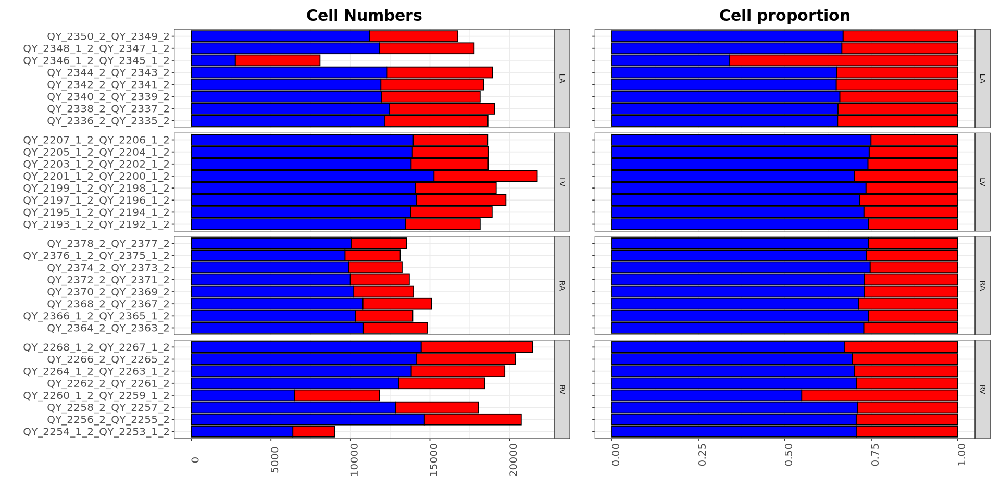

In [20]:
options(repr.plot.width=16, repr.plot.height=8)
gg1 + gg2 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

## Cell proportions lane/donor

In [52]:
cell.sample = as.data.frame(table(adata$donor, adata$library, adata$chamber, adata$condition))
colnames(cell.sample)[1] = "donor"
colnames(cell.sample)[2] = "library"
colnames(cell.sample)[3] = "chamber"
colnames(cell.sample)[4] = "condition"
cell.sample = dplyr::filter(cell.sample, Freq != 0)

In [53]:
width = 0.8
gg1 = ggplot(cell.sample, aes(x= library, y = Freq, fill = condition, label = Freq)) + 
            theme_bw () +
            labs(y= "", x = "", title = paste("Cell #: ", length(colnames(adata[["RNA"]])))) +
            geom_bar(stat = 'identity', color = 'black', size = 0.5) +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip() +
            facet_nested(rows = vars(chamber), scales = "free", space = "free")

gg2 = ggplot(cell.sample, aes(x= library, y = Freq, fill = condition, label = Freq)) + 
            theme_bw () +
            labs(y= "", x = "", title = paste("Cell proportion")) +
            geom_bar(position = position_fill(reverse = FALSE), stat = 'identity', color = 'black', size = 0.5) +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                  axis.text.y = element_blank(),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip() +
            facet_nested(rows = vars(chamber), scales = "free", space = "free")

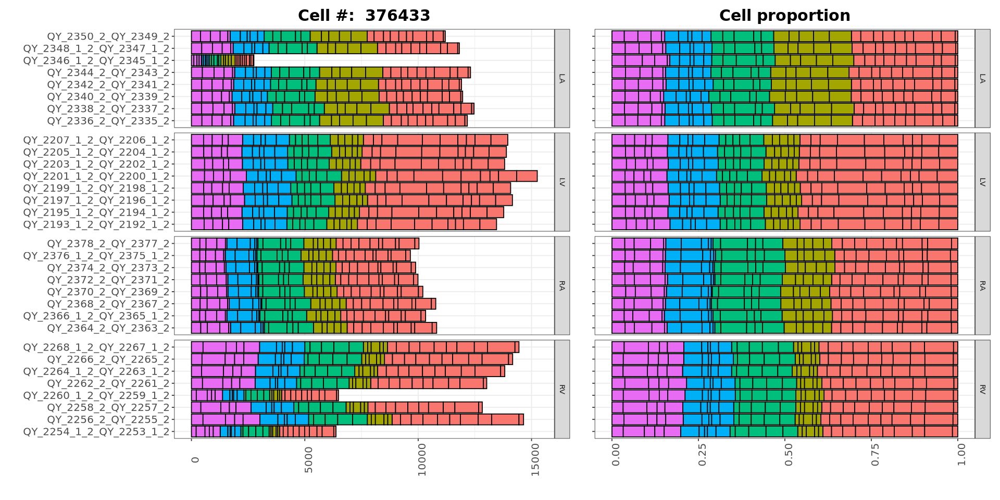

In [54]:
options(repr.plot.width=16, repr.plot.height=8)
gg1 + gg2 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

In [55]:
table(adata$donor, adata$chamber)

        
           LA   LV   RA   RV
  D35    2491 3566 2267 2469
  D36    3107 3184 2749 3509
  D37    2081 5436 2977 3313
  D38    2909 9230 4115 4088
  D40    2736 6245 3377 3637
  D47    2318 6134 1238 3120
  D51    4644 2885 4545 4974
  D52    2263 2930 1282 3859
  D53    3323 5800 5564 7830
  D55     671 6106 1559 1223
  DTX017 3262 4433 3050 3253
  DTX027 2842 2221 1550 1407
  DTX031 3804 2628 3102 1243
  DTX037 3353 3883 3598 5067
  DTX060 3434 2986 2189 6647
  DTX062 3223 3601 3912 2848
  DTX065 2558 2219 1677 1102
  DTX066 2659 2172 3042 2464
  DTX077 2786 2572 6142 3384
  DTX081 3833 2590 2289 2395
  DTX087 4853 2148 1841 3883
  DTX088 2502 2669 4834 1744
  DTX089  752 5070  552 4647
  DTX091 1743 3361 1775 4322
  DTX093  963 1486 1803  773
  DTX096 4209 1931 2495 1130
  DTX097 2690 3815  684 2257
  DTX105 2050 4548  348 3864
  DTX114 5463 1852 2083 1199
  DTX119 3054 4675 5051 4140

## Clustering

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



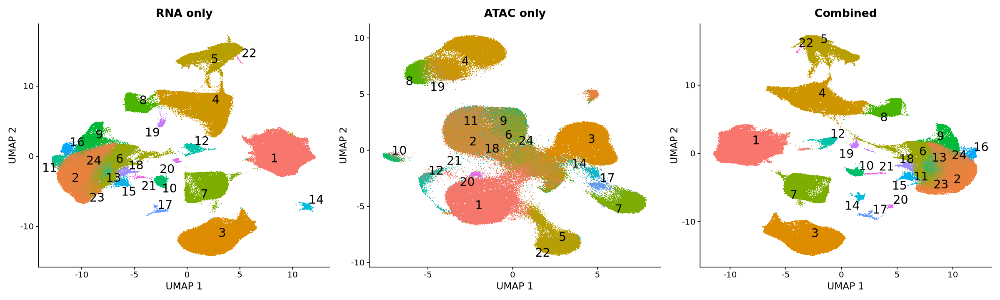

In [84]:
options(repr.plot.width=20, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='seurat_clusters', label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='seurat_clusters', label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='seurat_clusters', label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

# Clean-up

In [85]:
sample.ls = levels(factor(adata$library))
sample.ls

[1] "QY_2193_1_2_QY_2192_1_2" "QY_2195_1_2_QY_2194_1_2"
 [3] "QY_2197_1_2_QY_2196_1_2" "QY_2199_1_2_QY_2198_1_2"
 [5] "QY_2201_1_2_QY_2200_1_2" "QY_2203_1_2_QY_2202_1_2"
 [7] "QY_2205_1_2_QY_2204_1_2" "QY_2207_1_2_QY_2206_1_2"
 [9] "QY_2254_1_2_QY_2253_1_2" "QY_2256_2_QY_2255_2"    
[11] "QY_2258_2_QY_2257_2"     "QY_2260_1_2_QY_2259_1_2"
[13] "QY_2262_2_QY_2261_2"     "QY_2264_1_2_QY_2263_1_2"
[15] "QY_2266_2_QY_2265_2"     "QY_2268_1_2_QY_2267_1_2"
[17] "QY_2336_2_QY_2335_2"     "QY_2338_2_QY_2337_2"    
[19] "QY_2340_2_QY_2339_2"     "QY_2342_2_QY_2341_2"    
[21] "QY_2344_2_QY_2343_2"     "QY_2346_1_2_QY_2345_1_2"
[23] "QY_2348_1_2_QY_2347_1_2" "QY_2350_2_QY_2349_2"    
[25] "QY_2364_2_QY_2363_2"     "QY_2366_1_2_QY_2365_1_2"
[27] "QY_2368_2_QY_2367_2"     "QY_2370_2_QY_2369_2"    
[29] "QY_2372_2_QY_2371_2"     "QY_2374_2_QY_2373_2"    
[31] "QY_2376_1_2_QY_2375_1_2" "QY_2378_2_QY_2377_2"

## Figure out thresholds

In [14]:
options(future.globals.maxSize= 90000000000) #this is 60gb
adata <- TSSEnrichment(object = adata)

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score



In [15]:
### Write  RDS
# Tssenrichment is a long step we don't want to re-do, it's worth saving the object again
log_print("Saving RDS")
file = paste(step1.dir, "LV_RV_LA_RA.multiome.mrg.rds", sep = "")
saveRDS(adata, file = file)
log_print("RDS - Saved")

[1] "Saving RDS"
[1] "RDS - Saved"


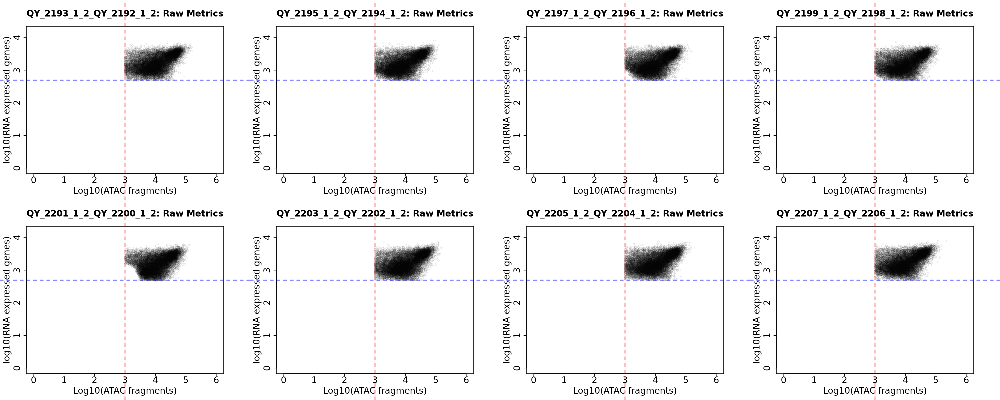

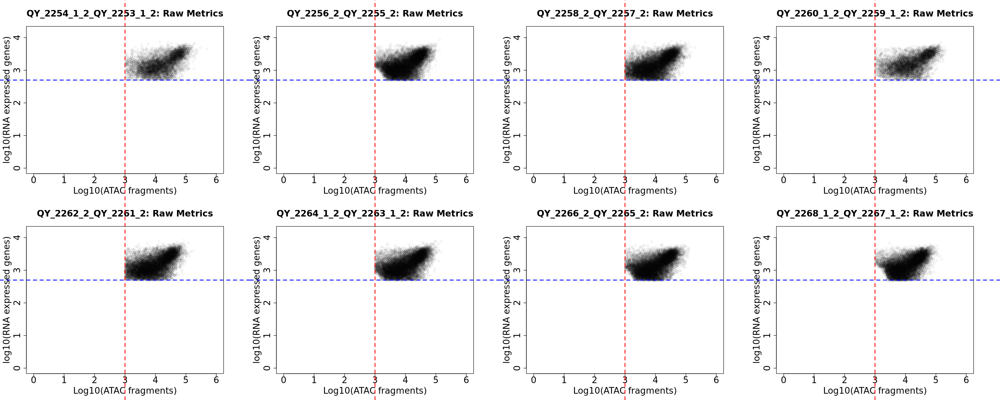

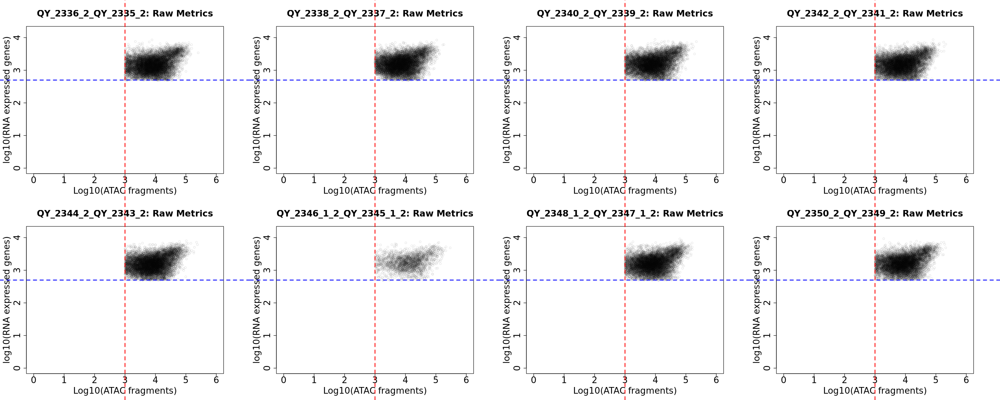

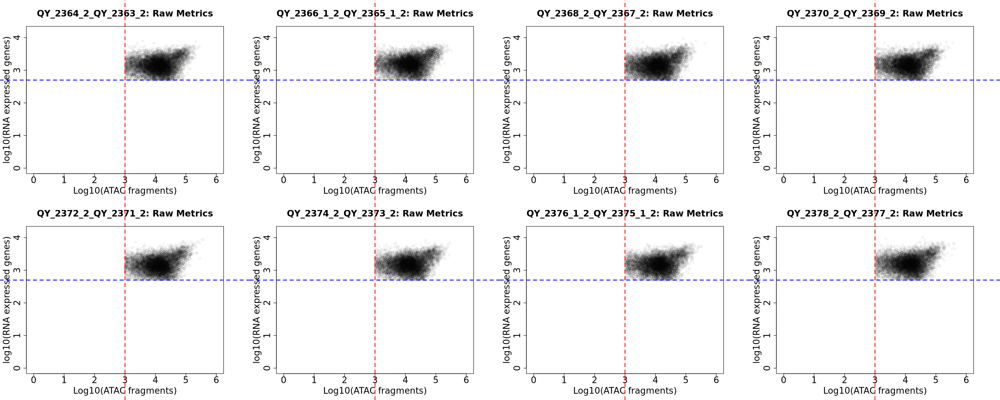

In [16]:
par(mfrow=c(2,4),xpd = T, mar = c(5,5,5,5))
options(repr.plot.width=25, repr.plot.height=10)

for (i in seq_along(sample.ls)){
    sample = sample.ls[i]
    adata.use = subset(x = adata, subset = library == sample)
    metadata <- as.data.frame(as.matrix(adata.use@meta.data))
    metadata$atac_fragments = as.numeric(metadata$atac_fragments)
    metadata$nFeature_RNA = as.numeric(metadata$nFeature_RNA)
    log_data <- data.frame(genes=log10(metadata$nFeature_RNA),fragments=log10(metadata$atac_fragments))
    plot = plot(log_data$fragments, log_data$genes, pch=21, col = rgb(0, 0, 0, 0.1),
         cex=1, cex.main=2, cex.lab=2, cex.axis=2,
         xlim = c(0, log10(1000000)),
         ylim = c(0, log10(15000)),
         main=sprintf("%s: Raw Metrics",sample), xlab="Log10(ATAC fragments)", ylab="log10(RNA expressed genes)")
    abline(v = log10(1000), col="red", lwd=2, lty=2)
    #abline(v = log10(100000), col="red", lwd=2, lty=2)
    abline(h = log10(500), col="blue", lwd=2, lty=2)
    #abline(h = log10(5000), col="blue", lwd=2, lty=2)
    #abline(h = log10(6000), col="blue", lwd=2, lty=2)
    #abline(h = log10(8000), col="blue", lwd=2, lty=2)
    #abline(h = log10(7000), col="blue", lwd=2, lty=2)
}

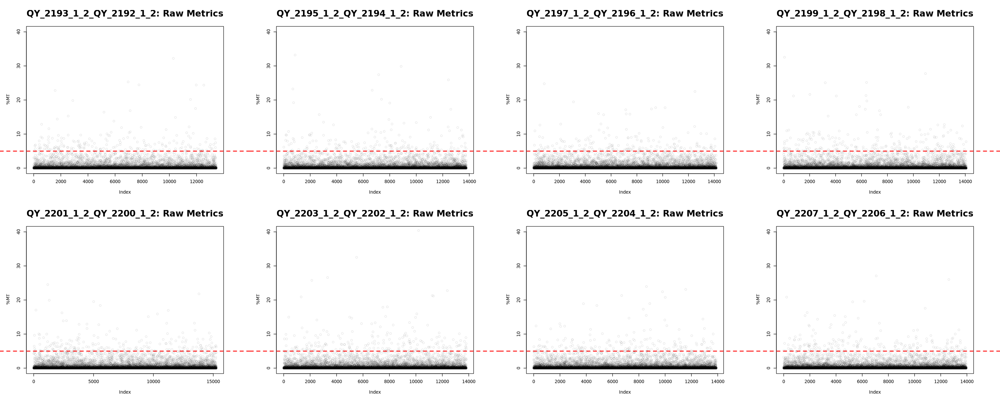

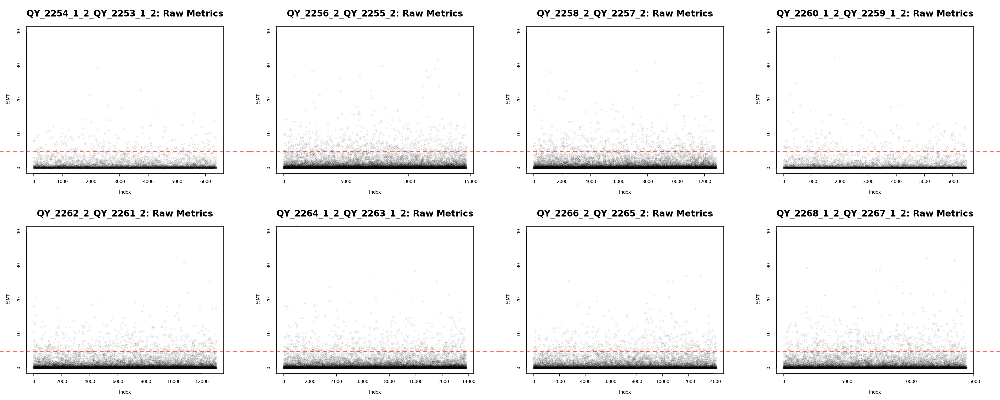

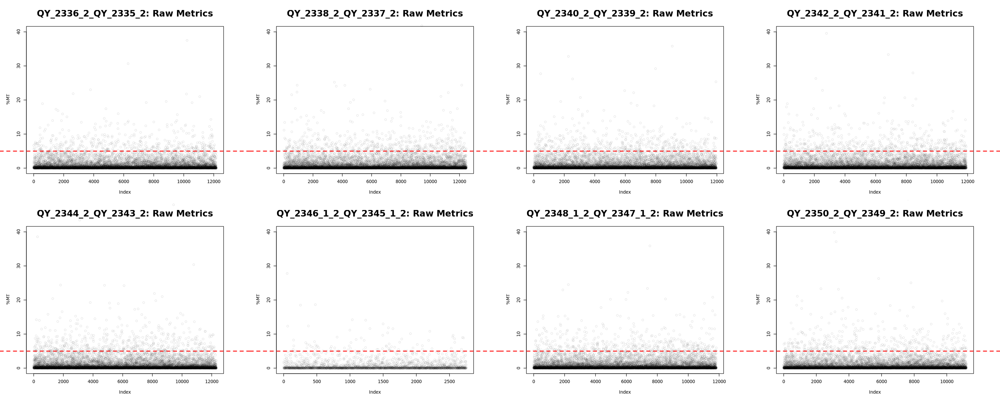

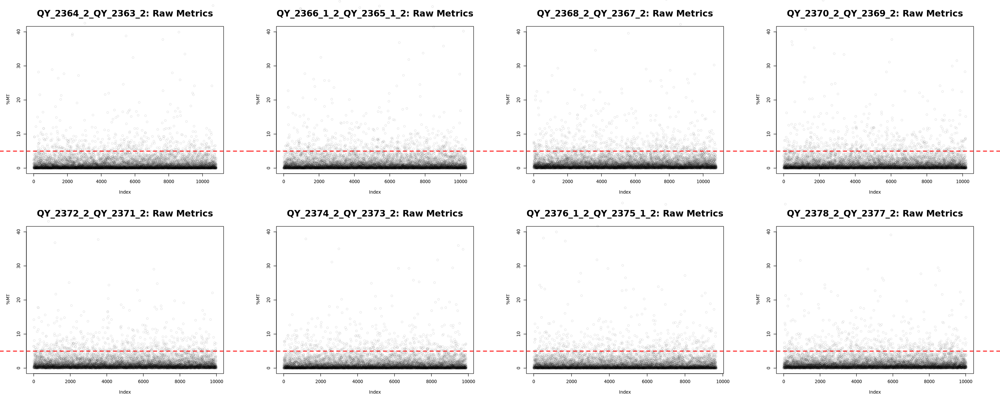

In [19]:
par(mfrow=c(2,4),xpd = T, mar = c(5,5,5,5))
options(repr.plot.width=25, repr.plot.height=10)

for (i in seq_along(sample.ls)){
    sample = sample.ls[i]
    adata.use = subset(x = adata, subset = library == sample)
    plot = plot(adata.use@meta.data$percent.mt,
     pch=21, col = rgb(0, 0, 0, 0.1),
     ylim = c(0, 40),
     ylab= "\n %MT",
         cex=1, cex.main=2, cex.lab=1, cex.axis=1,
         main=sprintf("%s: Raw Metrics",sample))
     #abline(h = 3, col="red", lwd=2, lty=2)    
     abline(h = 5, col="red", lwd=2, lty=2) 
}

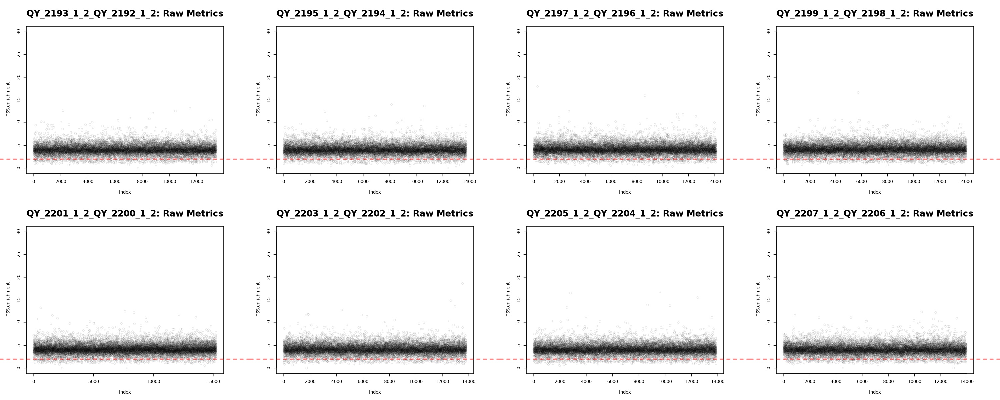

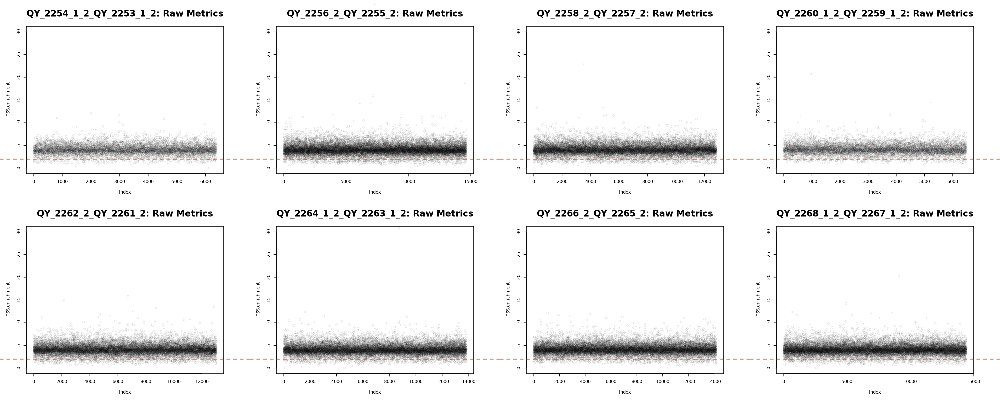

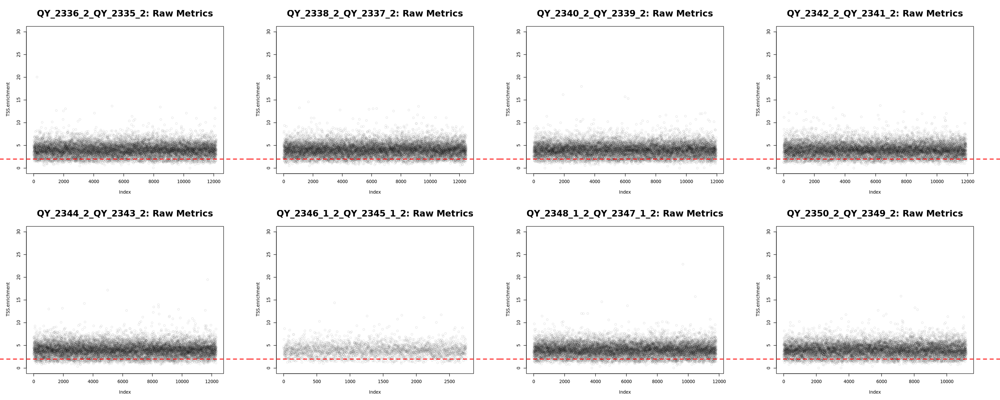

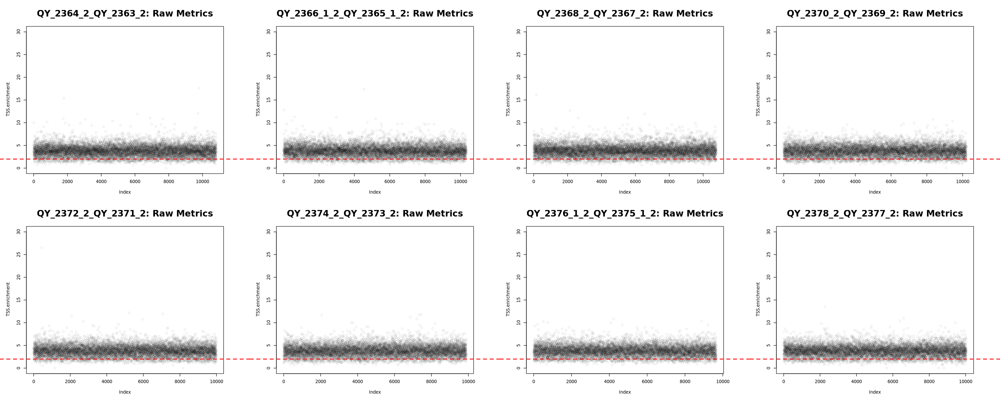

In [20]:
par(mfrow=c(2,4),xpd = T, mar = c(5,5,5,5))
options(repr.plot.width=25, repr.plot.height=10)

for (i in seq_along(sample.ls)){
    sample = sample.ls[i]
    adata.use = subset(x = adata, subset = library == sample)
    plot = plot(adata.use@meta.data$TSS.enrichment,
     pch=21, col = rgb(0, 0, 0, 0.1),
     ylim = c(0, 30),
     ylab= "\n TSS.enrichment",
         cex=1, cex.main=2, cex.lab=1, cex.axis=1,
         main=sprintf("%s: Raw Metrics",sample))
     abline(h = 2, col="red", lwd=2, lty=2) 
}

In [15]:
percentMT.max.tresh = 5
TSS.enrichment.min.tresh = 2

In [21]:
# Subset using the thresholds and save celltypes breakdown
pre.demuxlet = as.data.frame(table(demux$library))
pre.demuxlet$step = "pre.demuxlet"

post.demuxlet = as.data.frame(table(adata$library))
post.demuxlet$step = "post.demuxlet"

adata_sub <- subset(x = adata, subset = percent.mt <= percentMT.max.tresh)
post.pctMT = as.data.frame(table(adata_sub$library))
post.pctMT$step = "post.pctMT"

adata_sub <- subset(x = adata_sub, subset = TSS.enrichment >= TSS.enrichment.min.tresh)
post.TSSe = as.data.frame(table(adata_sub$library))
post.TSSe$step = "post.TSSe"
gc(reset = TRUE)

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,13990830,747.2,20570640,1098.6,13990830,747.2
Vcells,20685800926,157820.2,32962012331,251480.2,20685800926,157820.2


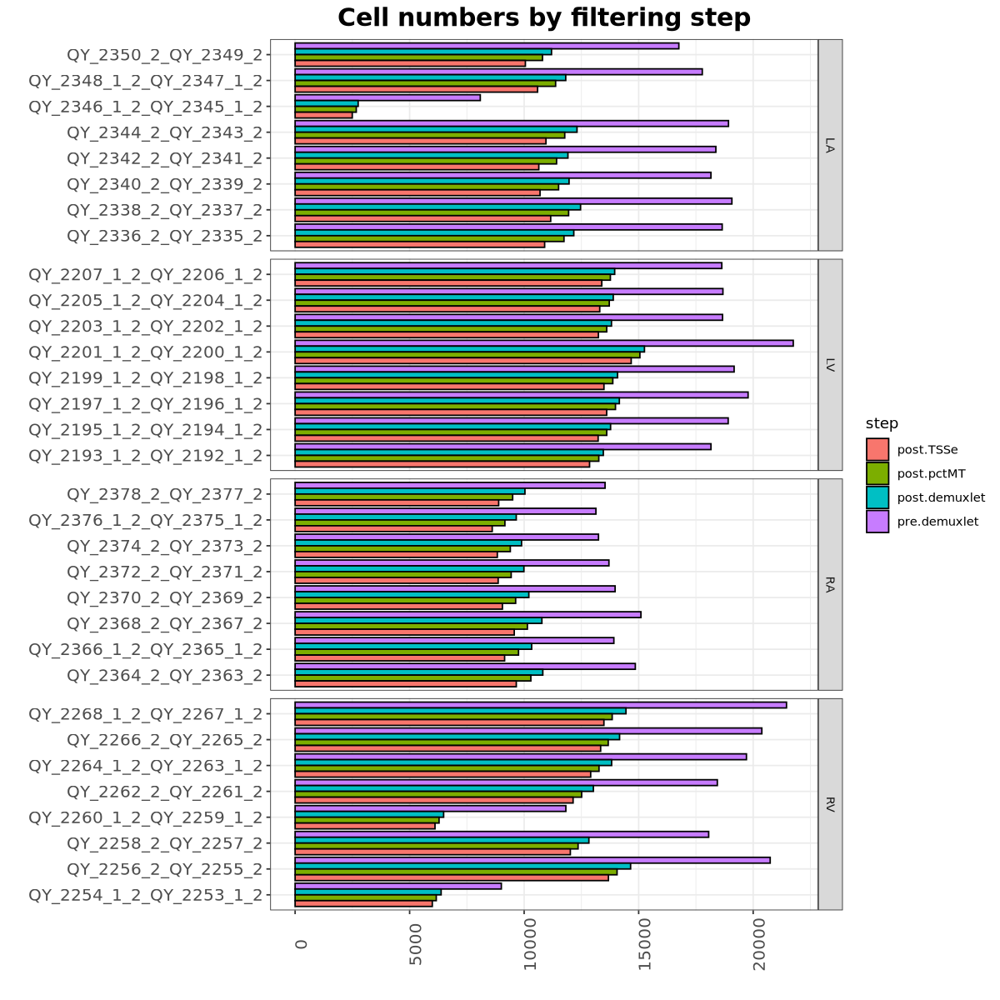

In [24]:
cell.number = rbind(pre.demuxlet, post.demuxlet, post.pctMT, post.TSSe)
cell.number$chamber <- sample.info$Chamber[match(cell.number$Var1, sample.info$ID)]
cell.number$step = factor(cell.number$step, levels = rev(c("pre.demuxlet", "post.demuxlet",
                                                     "post.pctMT", "post.TSSe")))


options(repr.plot.width=10, repr.plot.height=10)
ggplot(cell.number, aes(x = Var1, y = Freq, fill = step)) + 
            theme_bw () +
            labs(y= "", x = "", title = "Cell numbers by filtering step") +
            geom_bar(stat = 'identity', color = 'black', size = 0.5, position = "dodge") +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip()+
            facet_nested(rows = vars(chamber), scales = "free", space = "free")

In [25]:
# RNA plots
    p1 <- VlnPlot(adata_sub, features='nCount_RNA', group.by = 'library', pt.size=0, log=TRUE) + geom_boxplot(width=.6, fill='white', alpha=.6, pt.size=0) + geom_hline(yintercept=median(adata_sub$nCount_RNA, na.rm = TRUE), linetype='dashed', lw=2) + 
    theme(plot.title = element_text(size = 20), axis.text = element_text(size=12),
          axis.title = element_blank())
    p2 <- VlnPlot(adata_sub, features='nFeature_RNA', group.by = 'library', pt.size=0, log=TRUE) + geom_boxplot(width=.6, fill='white', alpha=.6, pt.size=0) + geom_hline(yintercept=median(adata_sub$nFeature_RNA, na.rm = TRUE), linetype='dashed', lw=2) + 
    theme(plot.title = element_text(size = 20), axis.text = element_text(size=12),
          axis.title = element_blank())
    p3 <- VlnPlot(adata_sub, features='percent.mt', group.by = 'library', pt.size=0) + geom_boxplot(width=.6, fill='white', alpha=.6) + geom_hline(yintercept=median(adata_sub$percent.mt, na.rm = TRUE), linetype='dashed')+
    theme(plot.title = element_text(size = 20), axis.text = element_text(size=12),
          axis.title = element_blank())

# ATAC plots
    p4 <- VlnPlot(adata_sub, features='nCount_ATAC', group.by = 'library', pt.size=0, log=TRUE) + geom_boxplot(width=.6, fill='white', alpha=.6, pt.size=0) + geom_hline(yintercept=median(adata_sub$nCount_ATAC, na.rm = TRUE), linetype='dashed', lw=2) + 
    theme(plot.title = element_text(size = 20), axis.text = element_text(size=12),
          axis.title = element_blank())
    p5 <- VlnPlot(adata_sub, features='atac_fragments', group.by = 'library', pt.size=0, log=TRUE) + geom_boxplot(width=.6, fill='white', alpha=.6) + geom_hline(yintercept=median(adata_sub$atac_fragments, na.rm = TRUE), linetype='dashed', lw=2)+
    theme(plot.title = element_text(size = 20), axis.text = element_text(size=12),
          axis.title = element_blank())
    p6 <- VlnPlot(adata_sub, features='TSS.enrichment', group.by = 'library', pt.size=0) + geom_boxplot(width=.6, fill='white', alpha=.6) + geom_hline(yintercept=median(adata_sub$TSS.enrichment, na.rm = TRUE), linetype='dashed', lw=2)+
    theme(plot.title = element_text(size = 20), axis.text = element_text(size=12),
          axis.title = element_blank())

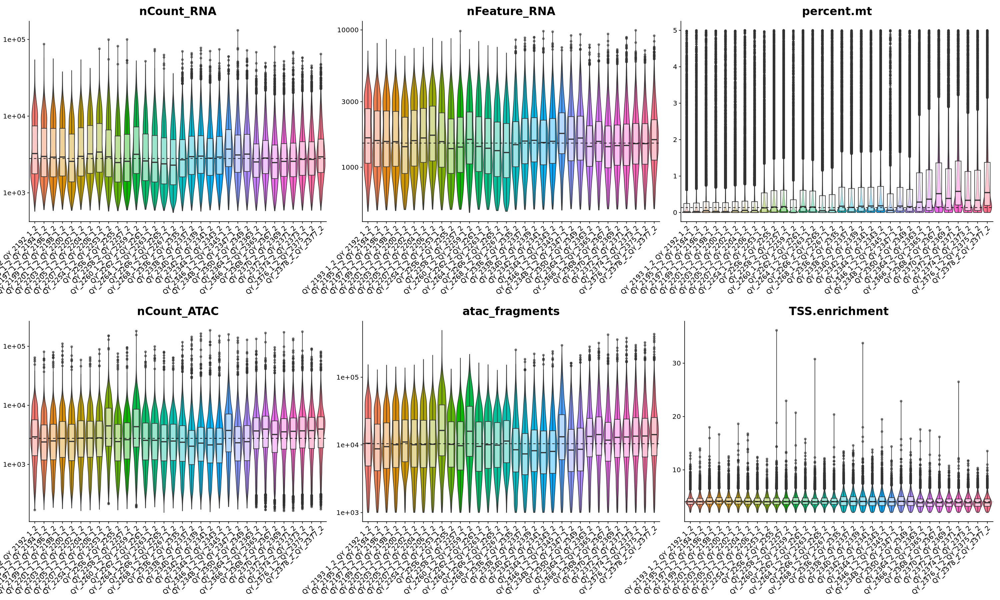

In [26]:
options(repr.plot.height = 15, repr.plot.width = 25)
ggarrange(p1, p2, p3,
          p4, p5, p6,
          ncol = 3, nrow = 2,
          common.legend = TRUE,legend="none")

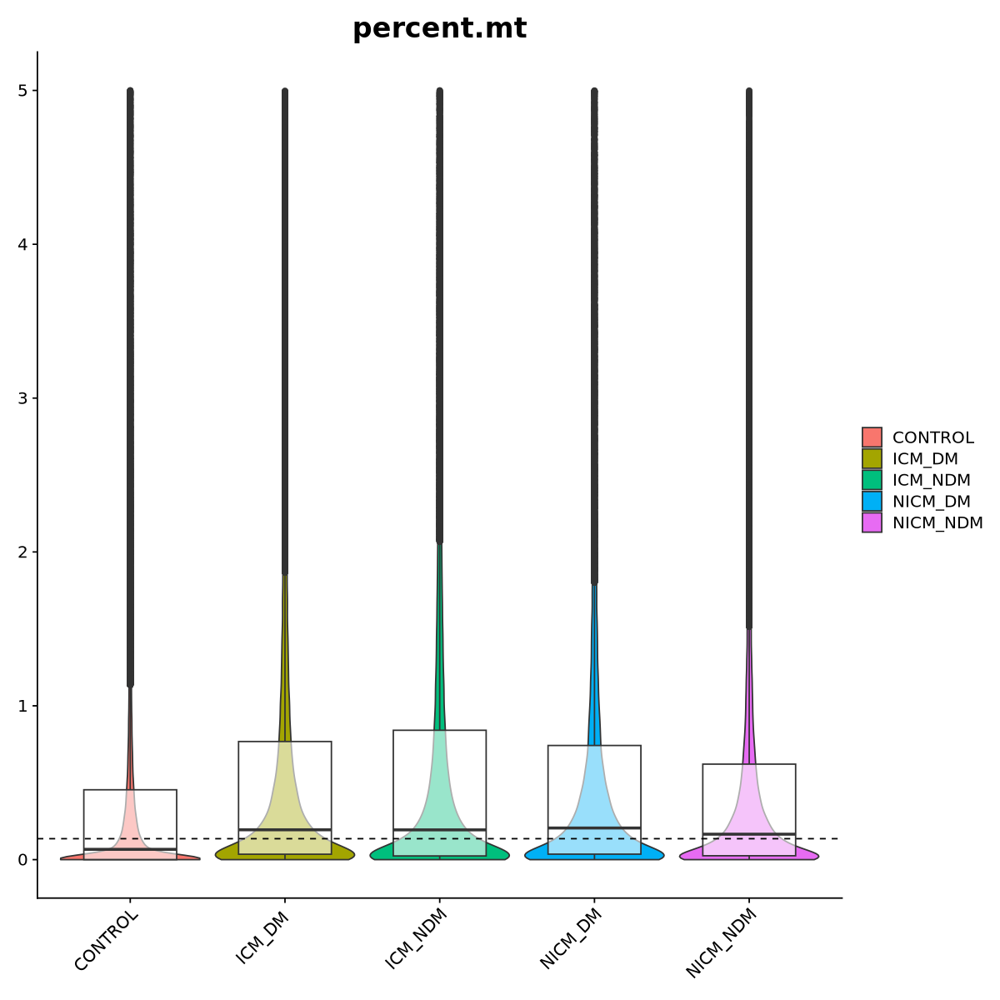

In [27]:
options(repr.plot.height = 10, repr.plot.width = 10)
VlnPlot(adata_sub, features='percent.mt', group.by = 'condition', pt.size=0) + geom_boxplot(width=.6, fill='white', alpha=.6) + geom_hline(yintercept=median(adata_sub$percent.mt, na.rm = TRUE), linetype='dashed')+
    theme(plot.title = element_text(size = 20), axis.text = element_text(size=12),
          axis.title = element_blank())

In [28]:
cell.sample = as.data.frame(table(adata$condition, adata$percent.mt > 3))
colnames(cell.sample)[1] = "condition"
colnames(cell.sample)[2] = "percent.mt3"
cell.sample = dplyr::filter(cell.sample, Freq != 0)

In [29]:
width = 0.8
gg1 = ggplot(dplyr::filter(cell.sample, percent.mt3 == TRUE), aes(x= condition, y = Freq, fill = percent.mt3, label = Freq)) + 
            theme_bw () +
            labs(y= "", x = "", title = paste(" # cells percent.mt > 3")) +
            geom_bar(stat = 'identity', color = 'black', size = 0.5) +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip()

gg2 = ggplot(cell.sample, aes(x= condition, y = Freq, fill = percent.mt3, label = Freq)) + 
            theme_bw () +
            labs(y= "", x = "", title = paste("proportion percent.mt > 3")) +
            geom_bar(position = position_fill(reverse = FALSE), stat = 'identity', color = 'black', size = 0.5) +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                  axis.text.y = element_blank(),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip()

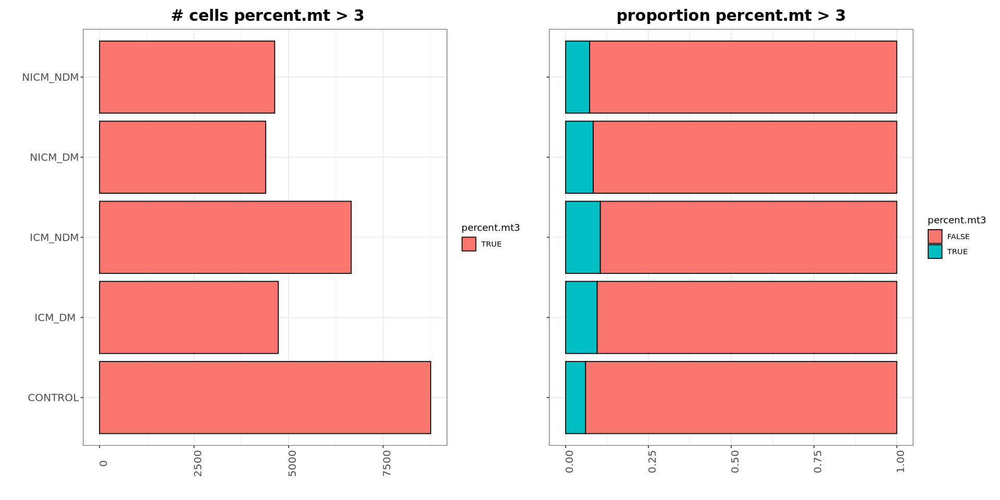

In [31]:
options(repr.plot.width=16, repr.plot.height=8)
gg1 + gg2 & theme(plot.title=element_text(hjust=0.5))

In [32]:
# If u like the cell numbers, let's reanalize and make some QC plots
adata = adata_sub

In [33]:
cell.sample = as.data.frame(table(adata$donor, adata$library, adata$chamber, adata$condition))
colnames(cell.sample)[1] = "donor"
colnames(cell.sample)[2] = "library"
colnames(cell.sample)[3] = "chamber"
colnames(cell.sample)[4] = "condition"
cell.sample = dplyr::filter(cell.sample, Freq != 0)

In [34]:
width = 0.8
gg1 = ggplot(cell.sample, aes(x= library, y = Freq, fill = condition, label = Freq)) + 
            theme_bw () +
            labs(y= "", x = "", title = paste("Cell #: ", length(colnames(adata[["RNA"]])))) +
            geom_bar(stat = 'identity', color = 'black', size = 0.5) +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip() +
            facet_nested(rows = vars(chamber), scales = "free", space = "free")

gg2 = ggplot(cell.sample, aes(x= library, y = Freq, fill = condition, label = Freq)) + 
            theme_bw () +
            labs(y= "", x = "", title = paste("Cell proportion")) +
            geom_bar(position = position_fill(reverse = FALSE), stat = 'identity', color = 'black', size = 0.5) +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                  axis.text.y = element_blank(),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip() +
            facet_nested(rows = vars(chamber), scales = "free", space = "free")

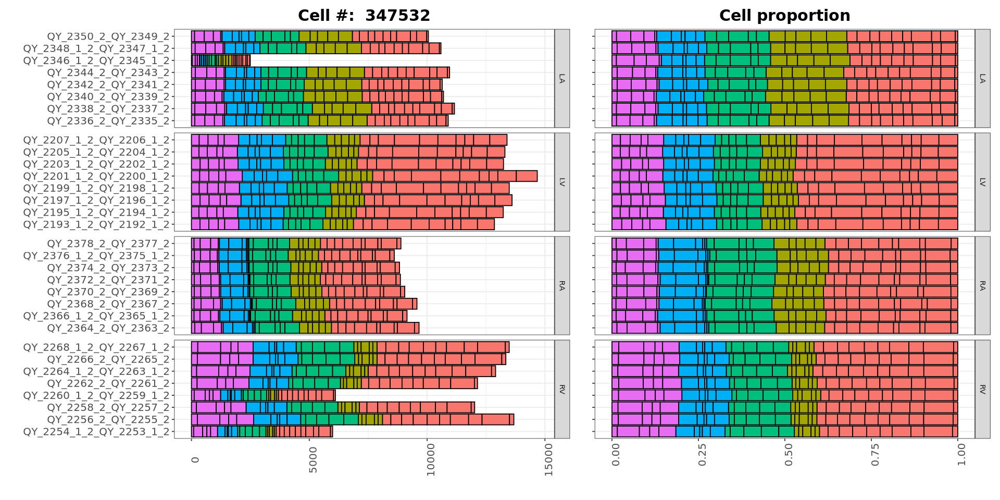

In [36]:
options(repr.plot.width=16, repr.plot.height=8)
gg1 + gg2 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

## Remove mitochondrial features and re-cluster

In [37]:
# Here we also decided to only harmonize by lane (library)

In [38]:
DefaultAssay(adata) <- 'RNA'
# Check if mitochondrial features are top features
adata <- FindVariableFeatures(adata, selection.method = "vst", nfeatures = 2000)
variable.features = data.frame(feature = VariableFeatures(adata),
                               rank = 1:length(VariableFeatures(adata)))

In [39]:
# Grab mitochondrial genes
mito.genes.index = grep(x = rownames(adata@assays$RNA$counts[,]),
      pattern = '^MT-')
mito.genes = rownames(adata@assays$RNA$counts[mito.genes.index,])
length(mito.genes)

[1] 13

In [40]:
# list originally by Ruth: '/nfs/lab/relgamal/MAGMA/group-646.csv'
ribosomal.mito.genes = c("MRPL1", "MRPL2", "MRPL3", "MRPL4", "MRPL9", "MRPL10", "MRPL11", "MRPL12",
  "MRPL13", "MRPL14", "MRPL15", "MRPL16", "MRPL17", "MRPL18", "MRPL19", "MRPL20",
  "MRPL21", "MRPL22", "MRPL23", "MRPL24", "MRPL27", "MRPL28", "MRPL30", "MRPL32", "MRPL33",
  "MRPL34", "MRPL35", "MRPL36", "MRPL37", "MRPL38", "MRPL39", "MRPL40", "MRPL41", "MRPL42",
  "MRPL43", "MRPL44", "MRPL45", "MRPL46", "MRPL47", "MRPL48", "MRPL49", "MRPL50", "MRPL51",
  "MRPL52", "MRPL53", "MRPL54", "MRPL55", "MRPL57", "MRPS2", "MRPS5", "MRPS6", "MRPS7", "MRPS9",
  "MRPS10", "MRPS11", "MRPS12", "MRPS14", "MRPS15", "MRPS16", "MRPS17", "MRPS18A", "MRPS18B", "MRPS18C",
  "MRPS21", "MRPS22", "MRPS23", "MRPS24", "MRPS25", "MRPS26", "MRPS27", "MRPS28", "DAP3", "MRPS30", "MRPS31", 
  "MRPS33", "MRPS34", "MRPS35", "MRPS36")

mito.genes.2 = ribosomal.mito.genes[ribosomal.mito.genes %in% rownames(adata@assays$RNA$counts[,])]
                            
mito.genes = c(mito.genes, mito.genes.2)
length(mito.genes.2)
mito.genes

[1] 78

[1] "MT-ND1"  "MT-ND2"  "MT-CO1"  "MT-CO2"  "MT-ATP8" "MT-ATP6" "MT-CO3" 
 [8] "MT-ND3"  "MT-ND4L" "MT-ND4"  "MT-ND5"  "MT-ND6"  "MT-CYB"  "MRPL1"  
[15] "MRPL2"   "MRPL3"   "MRPL4"   "MRPL9"   "MRPL10"  "MRPL11"  "MRPL12" 
[22] "MRPL13"  "MRPL14"  "MRPL15"  "MRPL16"  "MRPL17"  "MRPL18"  "MRPL19" 
[29] "MRPL20"  "MRPL21"  "MRPL22"  "MRPL23"  "MRPL24"  "MRPL27"  "MRPL28" 
[36] "MRPL30"  "MRPL32"  "MRPL33"  "MRPL34"  "MRPL35"  "MRPL36"  "MRPL37" 
[43] "MRPL38"  "MRPL39"  "MRPL40"  "MRPL41"  "MRPL42"  "MRPL43"  "MRPL44" 
[50] "MRPL45"  "MRPL46"  "MRPL47"  "MRPL48"  "MRPL49"  "MRPL50"  "MRPL51" 
[57] "MRPL52"  "MRPL53"  "MRPL54"  "MRPL55"  "MRPL57"  "MRPS2"   "MRPS5"  
[64] "MRPS6"   "MRPS7"   "MRPS9"   "MRPS10"  "MRPS11"  "MRPS12"  "MRPS14" 
[71] "MRPS15"  "MRPS16"  "MRPS17"  "MRPS18A" "MRPS18B" "MRPS18C" "MRPS21" 
[78] "MRPS22"  "MRPS23"  "MRPS24"  "MRPS25"  "MRPS26"  "MRPS27"  "MRPS28" 
[85] "DAP3"    "MRPS30"  "MRPS31"  "MRPS33"  "MRPS34"  "MRPS35"  "MRPS36"

In [41]:
dplyr::filter(variable.features, feature %in% mito.genes)

feature,rank
<chr>,<int>
MT-ND3,1309
MT-CO3,1488
MT-CO2,1586
MT-ATP6,1781
MT-ND4,1870


In [42]:
DefaultAssay(adata) <- 'RNA'
counts <- GetAssayData(adata, assay = "RNA")
counts <- counts[-(which(rownames(counts) %in% c(mito.genes))),]

adata.sub <- adata
adata.sub[["RNA"]] <- CreateAssayObject(counts = counts)

In [43]:
adata
adata.sub

An object of class Seurat 
221781 features across 347532 samples within 4 assays 
Active assay: RNA (36601 features, 2000 variable features)
 2 layers present: counts, data
 3 other assays present: RNA_raw, ATAC, SCT
 7 dimensional reductions calculated: pca, harmony.rna, umap.rna, lsi, harmony.atac, umap.atac, umap.wnn

An object of class Seurat 
221690 features across 347532 samples within 4 assays 
Active assay: RNA (36510 features, 0 variable features)
 2 layers present: counts, data
 3 other assays present: RNA_raw, ATAC, SCT
 7 dimensional reductions calculated: pca, harmony.rna, umap.rna, lsi, harmony.atac, umap.atac, umap.wnn

In [44]:
adata = adata.sub
rm(adata.sub)
gc(reset = TRUE)

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,14115873,753.9,20570640,1098.6,14115873,753.9
Vcells,10899674380,83158.0,32962012331,251480.2,10899674380,83158.0


In [46]:
# RNA analysis
log_print("Starting RNA analysis")
DefaultAssay(adata) <- 'RNA'
log_print("  - SCTransform")
adata <- SCTransform(adata, verbose=FALSE)
gc(reset = TRUE)
log_print("  - RunPCA")
adata <- RunPCA(adata)
log_print("  - RunHarmony")
adata <- RunHarmony(adata, group.by.vars= c('library'), assay.use='SCT', reduction.save='harmony.rna')
log_print("  - RunUMAP")
adata <- RunUMAP(adata, dims=1:50, reduction='harmony.rna', reduction.name='umap.rna', reduction.key='rnaUMAP_')

[1] "Starting RNA analysis"
[1] "  - SCTransform"


,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,14188777,757.8,20570640,1098.6,14188777,757.8
Vcells,13328290370,101686.8,66466749268,507101.1,13328290370,101686.8


[1] "  - RunPCA"


PC_ 1 
Positive:  RYR2, TTN, FGF12, FHL2, CTNNA3, MLIP, SORBS2, DMD, RBM20, SLC8A1 
	   CACNA1C, SGCD, LINC02208, PDE3A, MYOM1, TECRL, NEBL, AC092353.2, PALLD, ANKRD1 
	   CACNB2, CDH2, PDLIM5, TTN-AS1, ERBB4, LDB3, CHRM2, FHOD3, TRDN, TRDN-AS1 
Negative:  F13A1, MRC1, FMN1, RBPJ, CD163, MAN1A1, CD163L1, DCN, MERTK, RBM47 
	   RAB31, MS4A6A, CPM, SIPA1L1, SLC9A9, GSN, MGP, IQGAP2, TBXAS1, PDGFC 
	   SMAP2, CDH19, SLCO2B1, MS4A4A, FGF13, COLEC12, ELMO1, CFD, KCNMA1, LDB2 
PC_ 2 
Positive:  F13A1, MRC1, FMN1, RBPJ, CD163, CD163L1, RYR2, MERTK, RBM47, MAN1A1 
	   PDGFC, MS4A6A, RAB31, CPM, TTN, TBXAS1, FGF13, SMAP2, MS4A4A, IQGAP2 
	   SLCO2B1, LYVE1, MS4A4E, SIPA1L1, KCNMA1, PTPRC, MSR1, TLR2, AL162414.1, SAMSN1 
Negative:  DCN, CDH19, GSN, MGP, NEGR1, CFD, C7, CFH, PLA2G2A, KAZN 
	   SCN7A, APOD, POSTN, LUM, FN1, IGFBP7, ACSM3, BICC1, FBN1, FBLN1 
	   SPARCL1, CCN2, COL3A1, LDB2, EBF1, ABCA10, KCNT2, COL1A2, COL6A3, LAMA2 
PC_ 3 
Positive:  DCN, CDH19, NEGR1, CFD, GSN, F13A1, MGP, KAZN,

[1] "  - RunHarmony"


Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony converged after 4 iterations



[1] "  - RunUMAP"


14:16:14 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'

14:16:14 Read 347532 rows and found 50 numeric columns

14:16:14 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'

14:16:14 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:17:33 Writing NN index file to temp file /nfs/lab/Luca/TMP/Rtmpt7RtEs/file31f4a32d52d541

14:17:36 Searching Annoy index using 10 threads, search_k = 3000

14:17:59 Annoy recall = 93.31%

14:18:01 Commencing smooth kNN distance calibration using 10 threads
 with target n_neighbors = 30

14:18:23 Initializing from n

In [47]:
# ATAC analysis
log_print("Starting ATAC analysis")
DefaultAssay(adata) <- 'ATAC'
log_print("  - RunTFIDF")
adata <- RunTFIDF(adata)
adata <- FindTopFeatures(adata, min.cutoff='q0', verbose=FALSE)
log_print("  - RunSVD")
adata <- RunSVD(adata)
log_print("  - RunHarmony")
hm_atac <- HarmonyMatrix(Embeddings(adata, reduction='lsi'), 
                         vars_use = c('library'), meta_data = adata@meta.data, 
                         do_pca=FALSE)
adata[['harmony.atac']] <- CreateDimReducObject(embeddings=hm_atac, key='atac_', assay='ATAC')
log_print("  - RunUMAP")
adata <- RunUMAP(adata, dims=2:50, reduction='harmony.atac', reduction.name='umap.atac', reduction.key='atacUMAP_')

[1] "Starting ATAC analysis"
[1] "  - RunTFIDF"


Performing TF-IDF normalization



[1] "  - RunSVD"


Running SVD

Scaling cell embeddings



[1] "  - RunHarmony"


Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony converged after 2 iterations



[1] "  - RunUMAP"


15:15:02 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'

15:15:03 Read 347532 rows and found 49 numeric columns

15:15:03 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'

15:15:03 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:16:01 Writing NN index file to temp file /nfs/lab/Luca/TMP/Rtmpt7RtEs/file31f4a32e84a734

15:16:04 Searching Annoy index using 10 threads, search_k = 3000

15:16:35 Annoy recall = 100%

15:16:38 Commencing smooth kNN distance calibration using 10 threads
 with target n_neighbors = 30

15:16:59 Initializing from nor

In [48]:
# Combining Modalities
log_print("Combining Modalities")
log_print("  - FindMultiModalNeighbors")
adata <- FindMultiModalNeighbors(adata, reduction.list=list('harmony.rna', 'harmony.atac'), dims.list=list(1:50, 2:50))
log_print("  - RunUMAP")
adata <- RunUMAP(adata, nn.name='weighted.nn', reduction.name='umap.wnn', reduction.key='wnnUMAP_')
log_print("  - FindClusters")
adata <- FindClusters(adata, graph.name='wsnn', algorithm=4,  resolution = 0.5, verbose=FALSE, method = 'igraph')

adata$log_nCount_ATAC=log(adata$nCount_ATAC)
adata$log_nCount_SCT=log(adata$nCount_SCT)
adata$log_nFeature_ATAC=log(adata$nFeature_ATAC)
adata$log_nFeature_SCT=log(adata$nFeature_SCT)

[1] "Combining Modalities"
[1] "  - FindMultiModalNeighbors"


Calculating cell-specific modality weights

Finding 20 nearest neighbors for each modality.

Calculating kernel bandwidths

Finding multimodal neighbors

Constructing multimodal KNN graph

Constructing multimodal SNN graph



[1] "  - RunUMAP"


15:41:12 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'

15:41:16 Commencing smooth kNN distance calibration using 10 threads
 with target n_neighbors = 20

15:41:16 8 smooth knn distance failures

15:41:31 Initializing from normalized Laplacian + noise (using RSpectra)

15:43:27 Commencing optimization for 200 epochs, with 11548616 positive edges

15:47:20 Optimization finished



[1] "  - FindClusters"


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



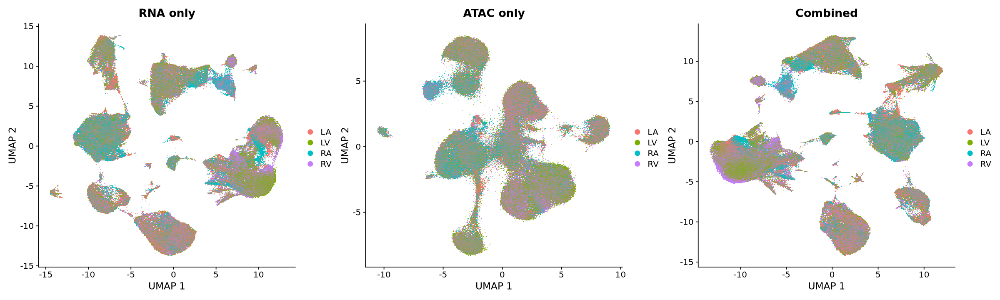

In [78]:
options(repr.plot.width=20, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='chamber', label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='chamber', label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='chamber',  label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & theme(plot.title=element_text(hjust=0.5))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



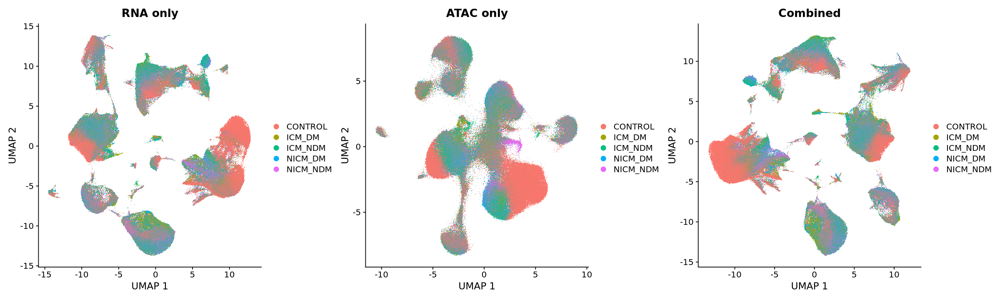

In [79]:
options(repr.plot.width=20, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='condition', label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='condition',  label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='condition', label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & theme(plot.title=element_text(hjust=0.5))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



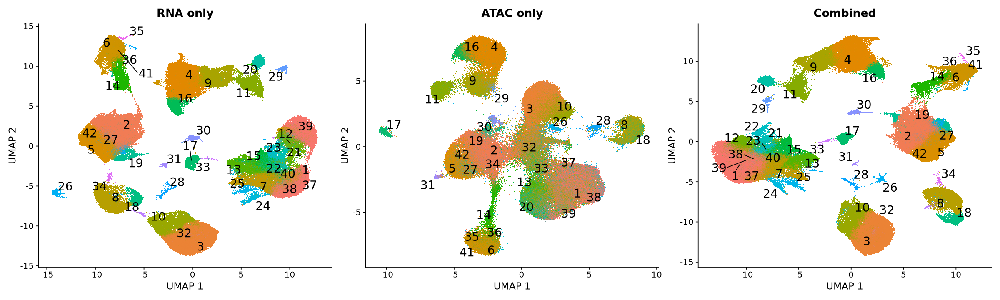

In [80]:
options(repr.plot.width=20, repr.plot.height=6)
p1 <- DimPlot(adata, reduction='umap.rna', group.by='seurat_clusters', label=TRUE, label.size=6, repel=TRUE) + ggtitle('RNA')
p1 <- p1 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('RNA only')
p2 <- DimPlot(adata, reduction='umap.atac', group.by='seurat_clusters', label=TRUE, label.size=6, repel=TRUE) + ggtitle('ATAC')
p2 <- p2 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('ATAC only')
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='seurat_clusters', label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p1 + p2 + p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

In [81]:
cell.cluster = as.data.frame(table(adata$chamber, adata$seurat_clusters))
colnames(cell.cluster)[1] = "chamber"
colnames(cell.cluster)[2] = "seurat_clusters"
cell.cluster = dplyr::filter(cell.cluster, Freq != 0)

In [82]:
width = 0.8
gg1 = ggplot(cell.cluster, aes(x= seurat_clusters, y = Freq, fill = chamber, label = Freq)) + 
            theme_bw () +
            labs(y= "", x = "", title = paste("Cell #: ", length(colnames(adata[["RNA"]])))) +
            geom_bar(stat = 'identity', color = 'black', size = 0.5) +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip()

gg2 = ggplot(cell.cluster, aes(x= seurat_clusters, y = Freq, fill = chamber, label = Freq)) + 
            theme_bw () +
            labs(y= "", x = "", title = paste("Cell proportion")) +
            geom_bar(position = position_fill(reverse = FALSE), stat = 'identity', color = 'black', size = 0.5) +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                  axis.text.y = element_blank(),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip()

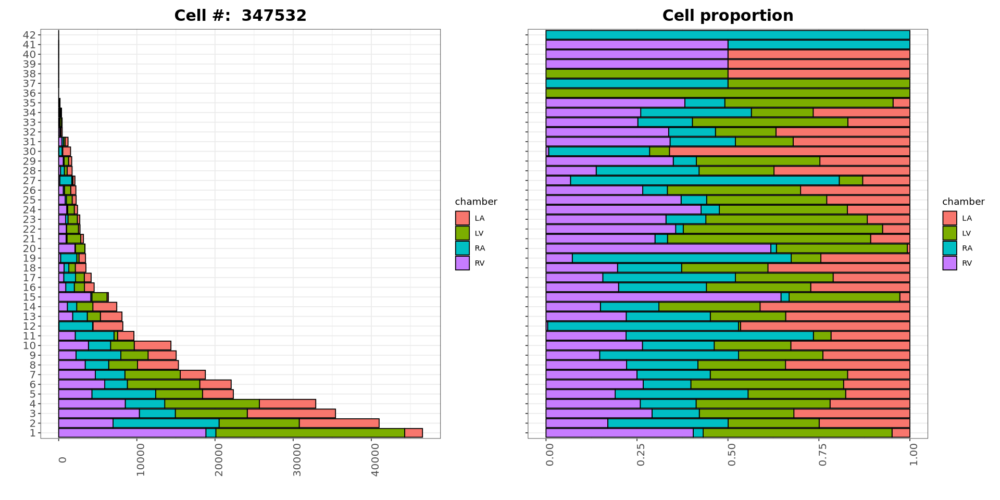

In [83]:
options(repr.plot.width=16, repr.plot.height=8)
gg1 + gg2 & theme(plot.title=element_text(hjust=0.5))

# CellType assignment

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



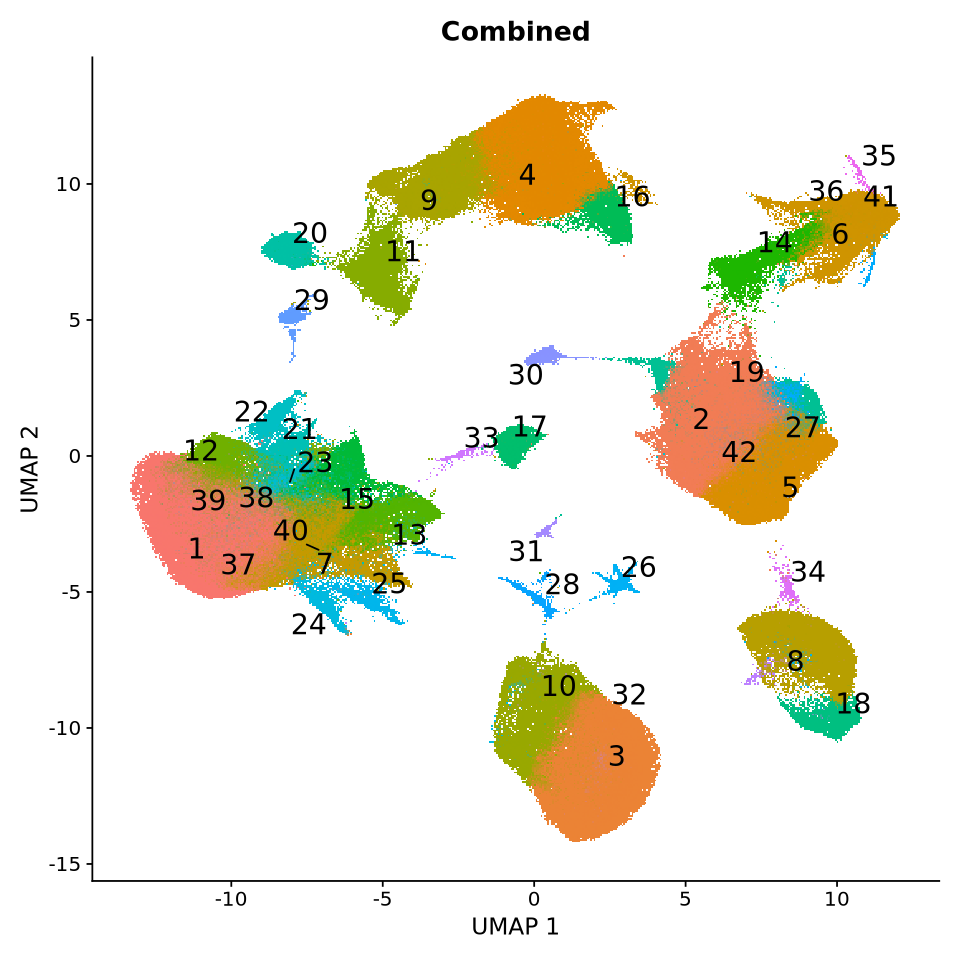

In [86]:
options(repr.plot.width=8, repr.plot.height=8)
p3 <- DimPlot(adata, reduction='umap.wnn', group.by='seurat_clusters', label=TRUE, label.size=6, repel=TRUE) + ggtitle('WNN')
p3 <- p3 + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
p3 & NoLegend() & theme(plot.title=element_text(hjust=0.5))

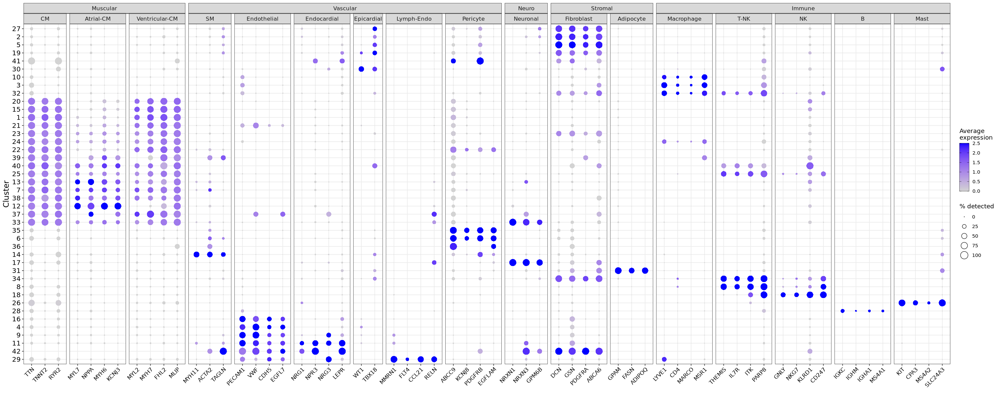

In [106]:
adata <- SetIdent(adata, value = adata$seurat_clusters)
g = DotPlot(adata, assay='SCT', features=cell.markers$marker, cluster.idents=TRUE, col.min=0) +
        theme(axis.text.x=element_text(angle=45, hjust=1)) + xlab('') + ylab('')
    meta_summary = g$data
    colnames(meta_summary)[3] = "marker"
    meta_summary = merge(meta_summary, cell.markers, by = "marker")

    options(repr.plot.width=25, repr.plot.height=10)
    figure <- ggplot(meta_summary, aes(x = marker, y = id)) +
      geom_point(aes(size = pct.exp, fill = avg.exp.scaled, stroke=NA),
                 shape = 21) +
      scale_size("% detected", range = c(0, 6)) +
      scale_fill_gradient(low = "lightgray", high = "blue",
                           guide = guide_colorbar(nbin = 200,
                                                  ticks.colour = "black", frame.colour = "black"),
                           name = "Average\nexpression") +
      ylab("Cluster") + xlab("") +
      theme_bw() +
      theme(axis.text = element_text(size = 100),
            axis.text.x = element_text(size = 10, angle = 45, hjust = 1, color = "black"),
            strip.text.x = element_text(size = 10),
            axis.text.y = element_text(size = 12, color = "black"),
            axis.title = element_text(size = 14)) +
      facet_nested(cols = vars(Compartment, CellType), scales = "free", space = "free")
figure

In [107]:
levels(cell.markers$CellType)

[1] "CM"             "Atrial-CM"      "Ventricular-CM" "SM"            
 [5] "Endothelial"    "Endocardial"    "Epicardial"     "Lymph-Endo"    
 [9] "Pericyte"       "Neuronal"       "Fibroblast"     "Adipocyte"     
[13] "Macrophage"     "T-NK"           "NK"             "B"             
[17] "Mast"

In [108]:
# list cluster numbers as they appear in the dotplot
clusters = rev(levels(g$data$id))
clusters
# visually determine celltypes
celltypes = c("Fibroblast", "Fibroblast", "Fibroblast", "Fibroblast", "Pericyte", "Epicardial",
              "Macrophage", "Macrophage", "Macrophage", "CM", "CM", "CM", 
              "CM", "CM", "CM", "CM", "CM", "CM",
              "CM", "CM", "CM", "CM", "CM", "CM",
              "CM", 'Pericyte', 'Pericyte', 'Pericyte', 'SM', 'Neuronal',
              'Adipocyte', 'T', "T", 'NK', 'Mast', 'B', 
              'Endothelial', 'Endothelial', 'Endothelial', 'Endocardial', "Fibroblast", 'Lymph-Endo')

length(clusters)
length(celltypes)

clusters.celltypes = data.frame(seurat_clusters = clusters,
                               celltypes = celltypes)

[1] "27" "2"  "5"  "19" "41" "30" "10" "3"  "32" "20" "15" "1"  "21" "23" "24"
[16] "22" "39" "40" "25" "13" "7"  "38" "12" "37" "33" "35" "6"  "36" "14" "17"
[31] "31" "34" "8"  "18" "26" "28" "16" "4"  "9"  "11" "42" "29"

[1] 42

[1] 42

In [109]:
adata <- SetIdent(adata, value = adata$seurat_clusters)
levels(adata)
adata$celltypes <- clusters.celltypes$celltypes[match(adata$seurat_clusters, clusters.celltypes$seurat_clusters)]
adata <- SetIdent(adata, value = adata$celltypes)
levels(adata)

[1] "1"  "2"  "3"  "4"  "5"  "6"  "7"  "8"  "9"  "10" "11" "12" "13" "14" "15"
[16] "16" "17" "18" "19" "20" "21" "22" "23" "24" "25" "26" "27" "28" "29" "30"
[31] "31" "32" "33" "34" "35" "36" "37" "38" "39" "40" "41" "42"

[1] "Fibroblast"  "Endothelial" "CM"          "Macrophage"  "Pericyte"   
 [6] "Mast"        "Endocardial" "T"           "SM"          "Neuronal"   
[11] "NK"          "Lymph-Endo"  "B"           "Epicardial"  "Adipocyte"

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



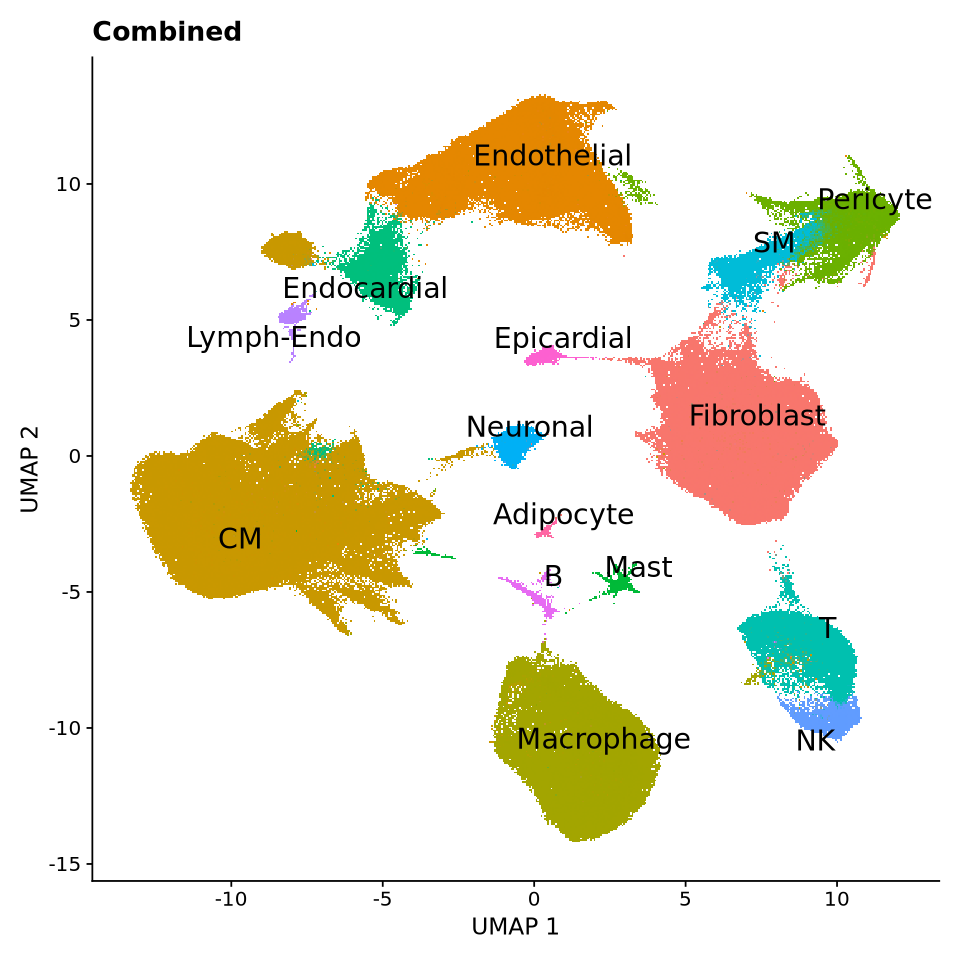

In [115]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(adata, reduction='umap.wnn', label=TRUE, label.size=6, repel=TRUE) +
ggtitle('WNN') + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined') + theme(legend.position = "none")

In [112]:
colors.use = c("cadetblue4", "salmon", "lightgoldenrod", 
    "paleturquoise3","palegreen3", "mediumpurple1", 
    "lightblue4", "navajowhite1", "magenta", "coral2", 
    "mediumorchid1", "midnightblue", "lightgoldenrodyellow", 
    "black", "lightgrey", "mistyrose4","darkcyan", "steelblue2", 
    "darkolivegreen3", "mediumpurple1", "lightskyblue", "firebrick2",
    "burlywood", "chartreuse1", "deeppink2", "khaki", "powderblue",
    "slategrey", "springgreen", "yellow3", "orange2", "lightsteelblue3", 
    "tomato3", "palegreen4", "grey27", "darkseagreen", "blue", "darkorchid",
    "snow2", "peachpuff2", "magenta2", "yellowgreen", "cornflowerblue",
    "chocolate", "blueviolet", "lighblue1", "plum2")

In [114]:
gg = DimPlot(adata, reduction='umap.wnn', label=TRUE, label.size=6, repel=TRUE, cols = colors.use) +
        ggtitle('WNN') + xlab('UMAP 1') + ylab('UMAP 2') + ggtitle('Combined')
ggsave('/nfs/lab/projects/mega_heart/FNIH/multiome/Analysis/1_preprocessing/umap.final.pdf',
       gg ,device = "pdf", height = 8, width = 8)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



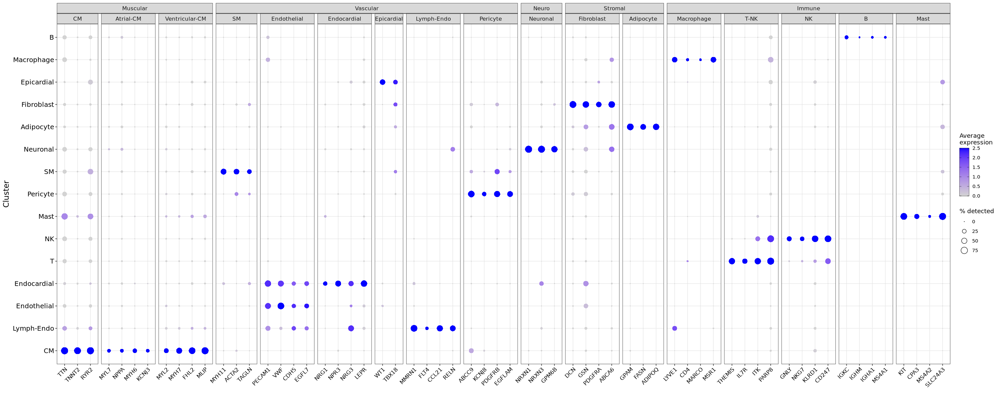

In [116]:
g = DotPlot(adata, assay='SCT', features=cell.markers$marker, cluster.idents=TRUE, col.min=0) +
        theme(axis.text.x=element_text(angle=45, hjust=1)) + xlab('') + ylab('')
    meta_summary = g$data
    colnames(meta_summary)[3] = "marker"
    meta_summary = merge(meta_summary, cell.markers, by = "marker")

    options(repr.plot.width=25, repr.plot.height=10)
    figure <- ggplot(meta_summary, aes(x = marker, y = id)) +
      geom_point(aes(size = pct.exp, fill = avg.exp.scaled, stroke=NA),
                 shape = 21) +
      scale_size("% detected", range = c(0, 6)) +
      scale_fill_gradient(low = "lightgray", high = "blue",
                           guide = guide_colorbar(nbin = 200,
                                                  ticks.colour = "black", frame.colour = "black"),
                           name = "Average\nexpression") +
      ylab("Cluster") + xlab("") +
      theme_bw() +
      theme(axis.text = element_text(size = 100),
            axis.text.x = element_text(size = 10, angle = 45, hjust = 1, color = "black"),
            strip.text.x = element_text(size = 10),
            axis.text.y = element_text(size = 12, color = "black"),
            axis.title = element_text(size = 14)) +
      facet_nested(cols = vars(Compartment, CellType), scales = "free", space = "free")
figure

In [ ]:
### Write  RDS
log_print("Saving RDS")
file = paste(step1.dir, "LV_RV_LA_RA.multiome.mrg.filt.MTless.rds", sep = "")
saveRDS(adata, file = file)
log_print("RDS - Saved")

[1] "Saving RDS"


# QC Plots

In [187]:
cell.sample = as.data.frame(table(adata$celltypes, adata$donor, adata$chamber, adata$condition))
colnames(cell.sample)[1] = "celltypes"
colnames(cell.sample)[2] = "donor"
colnames(cell.sample)[3] = "chamber"
colnames(cell.sample)[4] = "condition"
cell.sample = dplyr::filter(cell.sample, Freq != 0)

cell.sample$chamber = factor(cell.sample$chamber, levels = c("LA", "RA", "LV", "RV"))

In [194]:
width = 0.8
gg1 = ggplot(cell.sample, aes(x= celltypes, y = Freq, fill = condition, label = Freq)) + 
            theme_bw () +
            labs(y= "", x = "", title = paste("Cell #: ", length(colnames(adata[["RNA"]])))) +
            geom_bar(stat = 'identity', color = 'black', size = 0.5) +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip() +
            facet_wrap(~ chamber, scales = "fixed", ncol = 1)

gg2 = ggplot(cell.sample, aes(x= celltypes, y = Freq, fill = condition, label = Freq)) + 
            theme_bw () +
            labs(y= "", x = "", title = paste("Cell proportion")) +
            geom_bar(position = position_fill(reverse = FALSE), stat = 'identity', color = 'black', size = 0.5) +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5),
                  axis.text.y = element_blank())+
            coord_flip() +
            facet_wrap(~ chamber, scales = "fixed", ncol = 1)

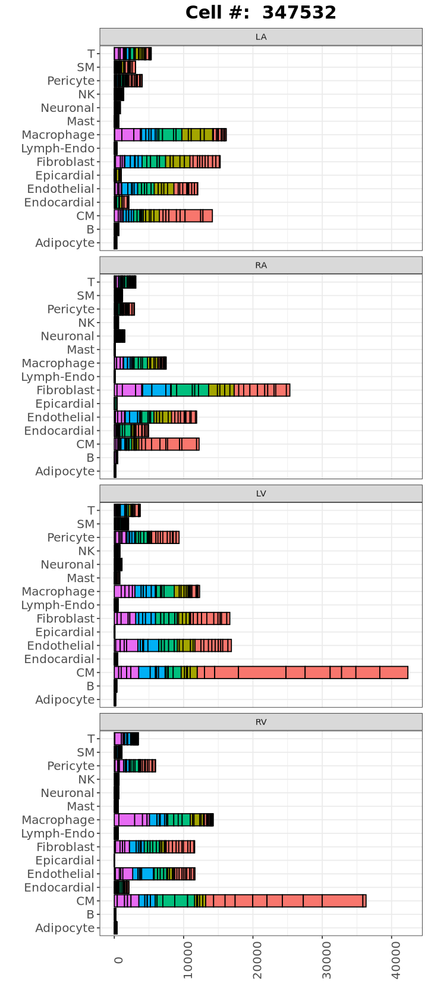

In [202]:
options(repr.plot.width=6, repr.plot.height=14)
gg1 & NoLegend()

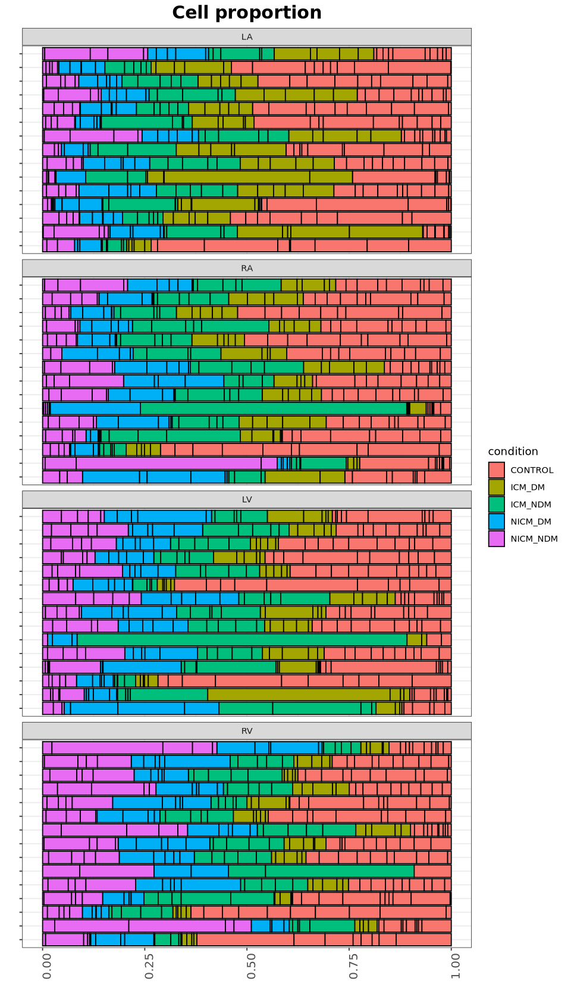

In [200]:
options(repr.plot.width=8, repr.plot.height=14)
gg2

In [12]:
# Create a combined metadata column to summarize clusters and celltypes
adata$cluster_celltype = paste0(adata$celltypes, "--", adata$seurat_clusters)

In [13]:
# RNA plots
    p1 <- VlnPlot(adata, features='nFeature_RNA', group.by = 'cluster_celltype', pt.size=0, log=TRUE) + geom_boxplot(width=.6, fill='white', alpha=.6, pt.size=0) + geom_hline(yintercept=median(adata$nFeature_RNA, na.rm = TRUE), linetype='dashed', lw=2) + 
    theme(plot.title = element_text(size = 20), axis.text = element_text(size=12),
          axis.title = element_blank())
    p2 <- VlnPlot(adata, features='percent.mt', group.by = 'cluster_celltype', pt.size=0) + geom_boxplot(width=.6, fill='white', alpha=.6) + geom_hline(yintercept=median(adata$percent.mt, na.rm = TRUE), linetype='dashed')+
    theme(plot.title = element_text(size = 20), axis.text = element_text(size=12),
          axis.title = element_blank())

# ATAC plots
    p3 <- VlnPlot(adata, features='atac_fragments', group.by = 'cluster_celltype', pt.size=0, log=TRUE) + geom_boxplot(width=.6, fill='white', alpha=.6) + geom_hline(yintercept=median(adata$atac_fragments, na.rm = TRUE), linetype='dashed', lw=2)+
    theme(plot.title = element_text(size = 20), axis.text = element_text(size=12),
          axis.title = element_blank())
    p4 <- VlnPlot(adata, features='TSS.enrichment', group.by = 'cluster_celltype', pt.size=0) + geom_boxplot(width=.6, fill='white', alpha=.6) + geom_hline(yintercept=median(adata$TSS.enrichment, na.rm = TRUE), linetype='dashed', lw=2)+
    theme(plot.title = element_text(size = 20), axis.text = element_text(size=12),
          axis.title = element_blank())

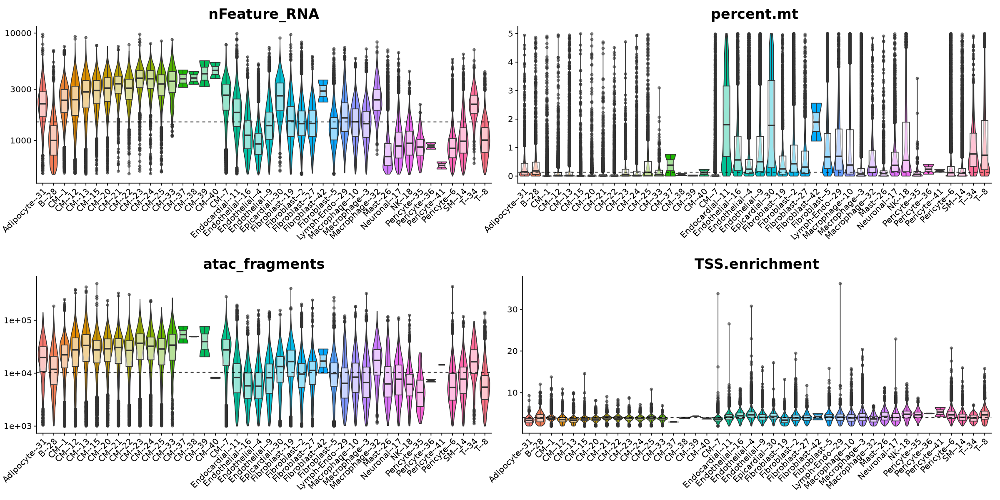

In [14]:
options(repr.plot.height = 10, repr.plot.width = 20)
ggarrange(p1, p2, p3, p4, 
          ncol = 2, nrow = 2,
          common.legend = TRUE,legend="none")

In [18]:
# Cell numbers
cell.cluster = as.data.frame(table(adata$celltypes))
colnames(cell.cluster)[1] = "celltype"
width = 0.8
position = position_dodge(width = width)
gg1 = ggplot(cell.cluster, aes(x= reorder(celltype, +Freq), y = Freq, label = Freq)) + 
            theme_bw () +
            labs(y= "", x = "", title = paste("Final Cells: ", length(colnames(adata[["RNA"]])))) +
            geom_bar(stat="identity", 
                     position = position, width = width,
                     colour="black") +
            ylim(0, 150000)+
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            geom_text(hjust = -0.3, size = 2.9, position = position_dodge(width = width))+
            coord_flip()

# Proportions
cell.cluster = as.data.frame(table(adata$celltypes, adata$library))
colnames(cell.cluster)[1] = "celltype"
colnames(cell.cluster)[2] = "library"
gg2 = ggplot(cell.cluster, aes(x= reorder(celltype, +Freq), y = Freq, label = Freq, fill = library)) + 
            theme_bw () +
            labs(y= "", x = "", title = paste("Final Cells: ", length(colnames(adata[["RNA"]])))) +
            geom_bar(position = position_fill(reverse = TRUE), stat = 'identity', color = 'black', size = 0.5) +
            theme(axis.text = element_text(size = 12), axis.title = element_text(size = 12, face = "bold"),
                  axis.text.x = element_text(angle = 90),
                             plot.title = element_text(size = 18, face = "bold", , hjust = 0.5))+
            coord_flip()

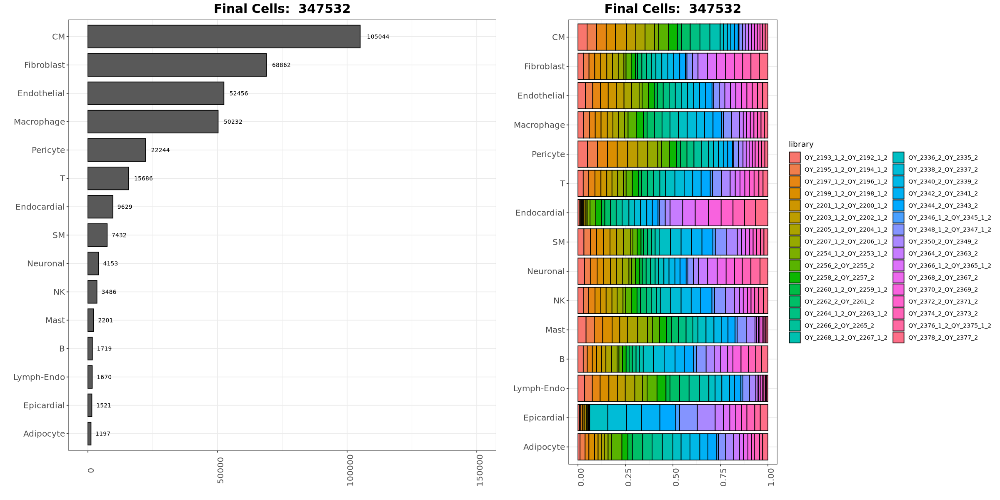

In [19]:
options(repr.plot.height = 10, repr.plot.width = 20)
ggarrange(gg1, gg2, ncol = 2, nrow = 1)